In [1]:
import os
import re
import json
import pickle
from pathlib import Path
import yaml

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import scipy
import skimage
import pandas as pd
import torch
import tifffile
from einops import rearrange, repeat

In [2]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
plt.rcParams['svg.fonttype'] = 'none'

In [3]:
%load_ext autoreload

In [4]:
%autoreload 2

In [5]:
import mushroom.utils as utils
import mushroom.visualization.utils as vis_utils
import mushroom.data.datasets as datasets
import mushroom.data.visium as visium
import mushroom.data.xenium as xenium
import mushroom.data.multiplex as multiplex
import mushroom.data.he as he
import mushroom.registration.bigwarp as bigwarp
from mushroom.mushroom import Mushroom

In [6]:
project_dir = '/data/estorrs/mushroom/data/projects/submission_v1'
output_dir = os.path.join(project_dir, 'analysis', 'export')
Path(output_dir).mkdir(parents=True, exist_ok=True)

In [7]:
def alter_filesystem(config, source_root, target_root):
    for entry in config['sections']:
        for mapping in entry['data']:
            mapping['filepath'] = mapping['filepath'].replace(source_root, target_root)
    
    if 'trainer_kwargs' in config and config['trainer_kwargs']['data_mask'] is not None:
        config['trainer_kwargs']['data_mask'] = config['trainer_kwargs']['data_mask'].replace(source_root, target_root)
        
    return config

In [8]:
source_root = '/diskmnt/Projects/Users/estorrs/mushroom/data'
target_root = '/data/estorrs/mushroom/data'

In [9]:
# exclude = ['S18-25943-A7', 'C3L-00970', 'WD-76845']
exclude = ['WD-76845']

In [10]:
fps = sorted(utils.listfiles(project_dir, regex=r'mushroom_50res/config.yaml$'))
fps

['/data/estorrs/mushroom/data/projects/submission_v1/C3L-00970/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/C3L-00982/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/C3L-01287/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/C3L-02551/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT225C1/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT268B1/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT339B2-H1/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-K2/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/mushroom_50res/co

In [11]:
case_to_sections = {fp.split('/')[-3]:yaml.safe_load(open(fp))['sections'] for fp in fps}
case_to_sections = {k:v for k, v in case_to_sections.items() if k not in exclude}
case_to_sections.keys()

dict_keys(['C3L-00970', 'C3L-00982', 'C3L-01287', 'C3L-02551', 'HT206B1', 'HT225C1', 'HT268B1', 'HT339B2-H1', 'HT397B1', 'HT413C1-K2', 'HT413C1-Th1k4A1', 'HT448C1-Th1K1Fp1', 'HT553P1-H2', 'HT565B1-H2', 'S18-25943-A7', 'S18-5591-C8', 'S18-9906', 'P21_F2RM6R'])

In [12]:
case = 'HT206B1'
# case = 'S18-5591-C8'
# case = 'S18-9906'
# case = 'HT413C1-Th1k4A1'
# case = 'C3L-00982'
# case = 'C3L-02551'
# case = 'C3L-00970'
# case = 'C3L-01287'

In [13]:
sections = case_to_sections[case]
sections

[{'data': [{'dtype': 'xenium',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s0_HT206B1-U1_xenium.h5ad'}],
  'position': 0,
  'sid': 'HT206B1-U1'},
 {'data': [{'dtype': 'multiplex',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s1_HT206B1-U2_multiplex.ome.tiff'}],
  'position': 5,
  'sid': 'HT206B1-U2'},
 {'data': [{'dtype': 'he',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s2_HT206B1-U4_he.tif'}],
  'position': 15,
  'sid': 'HT206B1-U4'},
 {'data': [{'dtype': 'multiplex',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s3_HT206B1-U5_multiplex.ome.tiff'}],
  'position': 20,
  'sid': 'HT206B1-U5'},
 {'data': [{'dtype': 'xenium',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s4_HT206B1-U8_xenium.h5ad'}],
  'position': 40,
  'sid': 'HT206B1-U8'},
 {'data': [{'dtype': 'xenium',
    'filep

In [14]:
dtype_to_volume = pickle.load(
    open(os.path.join(project_dir, case, 'mushroom_50res', f'nbhd_volumes_l2.pkl'), 'rb')
)['labeled'] 

outputs = pickle.load(
    open(os.path.join(project_dir, case, 'mushroom_50res', f'outputs.pkl'), 'rb')
)
section_ids = outputs['section_ids']
section_positions = outputs['section_positions']
section_ids, section_positions

([('HT206B1-U1', 'xenium'),
  ('HT206B1-U2', 'multiplex'),
  ('HT206B1-U4', 'he'),
  ('HT206B1-U5', 'multiplex'),
  ('HT206B1-U8', 'xenium'),
  ('HT206B1-U9', 'xenium'),
  ('HT206B1-U10', 'multiplex'),
  ('HT206B1-U12', 'he'),
  ('HT206B1-U13', 'multiplex'),
  ('HT206B1-U16', 'xenium'),
  ('HT206B1-U17', 'xenium'),
  ('HT206B1-U18', 'multiplex'),
  ('HT206B1-U20', 'he'),
  ('HT206B1-U21', 'multiplex'),
  ('HT206B1-U24', 'xenium')],
 array([ 0,  1,  3,  4,  8,  9, 10, 12, 13, 16, 17, 18, 20, 21, 24]))

In [15]:
mushroom = Mushroom.from_config(
    os.path.join(project_dir, case, 'mushroom_50res'), accelerator='cpu'
)

INFO:root:loading spore for he
INFO:root:data mask detected
INFO:root:starting he processing
INFO:root:3 sections detected: ['HT206B1-U4', 'HT206B1-U12', 'HT206B1-U20']
INFO:root:processing sections
INFO:root:generating image data for section HT206B1-U4


0.02


INFO:root:generating image data for section HT206B1-U12
INFO:root:generating image data for section HT206B1-U20
INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 3 sections detected: [('HT206B1-U4', 'he'), ('HT206B1-U12', 'he'), ('HT206B1-U20', 'he')]
INFO:root:creating data loaders
INFO:torch.distributed.nn.jit.instantiator:Created a temporary directory at /tmp/tmp12ohuqe0
INFO:torch.distributed.nn.jit.instantiator:Writing /tmp/tmp12ohuqe0/_remote_module_non_scriptable.py
INFO:root:creating ViT
INFO:root:model initialized


he torch.Size([3, 130, 121])


GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch/trainer/setup.py:187: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
INFO:root:loading checkpoint: /data/estorrs/mushroom/data/projects/submission_v1/HT206B1/mushroom_50res/he_chkpts/last-v3.ckpt
INFO:root:loading spore for multiplex
INFO:root:data mask detected
INFO:root:starting multiplex processing
INFO:root:using 36 channels
INFO:root:6 sections detected: ['HT206B1-U2', 'HT206B1-U5', 'HT206B1-U10', 'HT206B1-U13', 'HT206B1-U18', 'HT206B1-U21']
INFO:root:processing sections
INFO:root:generating image data for section HT206B1-U2


0.02


INFO:root:generating image data for section HT206B1-U5
INFO:root:generating image data for section HT206B1-U10
INFO:root:generating image data for section HT206B1-U13
INFO:root:generating image data for section HT206B1-U18
INFO:root:generating image data for section HT206B1-U21
INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 6 sections detected: [('HT206B1-U2', 'multiplex'), ('HT206B1-U5', 'multiplex'), ('HT206B1-U10', 'multiplex'), ('HT206B1-U13', 'multiplex'), ('HT206B1-U18', 'multiplex'), ('HT206B1-U21', 'multiplex')]
INFO:root:creating data loaders
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch/trainer/setup.py:187: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.

multiplex torch.Size([36, 130, 121])


INFO:root:using 377 channels
INFO:root:6 sections detected: ['HT206B1-U1', 'HT206B1-U8', 'HT206B1-U9', 'HT206B1-U16', 'HT206B1-U17', 'HT206B1-U24']
INFO:root:processing sections
INFO:root:generating image data for section HT206B1-U1
INFO:root:generating image data for section HT206B1-U8
INFO:root:generating image data for section HT206B1-U9
INFO:root:generating image data for section HT206B1-U16
INFO:root:generating image data for section HT206B1-U17
INFO:root:generating image data for section HT206B1-U24


xenium torch.Size([377, 131, 122])


INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 6 sections detected: [('HT206B1-U1', 'xenium'), ('HT206B1-U8', 'xenium'), ('HT206B1-U9', 'xenium'), ('HT206B1-U16', 'xenium'), ('HT206B1-U17', 'xenium'), ('HT206B1-U24', 'xenium')]
INFO:root:creating data loaders
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch/trainer/setup.py:187: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
INFO:root:loading checkpoint: /data/estorrs/mushroom/data/projects/submission_v1/HT206B1/mushroom_50res/xenium_chkpts/last-v3.ckpt
INFO:root:chkpt files detected, embedding to spores
INFO:root:embedding he spore
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch

Predicting: |                                                                                                 …

INFO:root:embedding multiplex spore


Predicting: |                                                                                                 …

INFO:root:embedding xenium spore


Predicting: |                                                                                                 …

In [16]:
out_dir = os.path.join(output_dir, case)

In [17]:
def save_assigned_nbhds(dtype):
    barcode_outs = os.path.join(out_dir, 'barcodes_to_nbhds')
    Path(barcode_outs).mkdir(parents=True, exist_ok=True)
    spore = mushroom.dtype_to_spore[dtype]
    Path(out_dir).mkdir(parents=True, exist_ok=True)
    sids = [x for x, _ in spore.section_ids]
    for sid in sids:
        if dtype in ['xenium', 'visium', 'cosmx']:
            a = spore.learner_data.dtype_to_section_to_adata[dtype][sid]
            pts = a.obsm['spatial']
            df = a.obs[[]]
        elif dtype in ['multiplex']:
            fp = os.path.join(project_dir, case, 'auxiliary', 'multiplex', f'{sid}.txt')
            df = pd.read_csv(fp, index_col=0, sep='\t')
            df.index.name = 'label'
            df = df[['row', 'col', 'cell_type']]
            pts = df[['col', 'row']].values.astype(int)
        else:
            raise RuntimeError(f'dtype {dtype} does not have barcodes to map')
        
        for level in range(mushroom.num_levels):

            labels = mushroom.assign_pts(pts, (sid, dtype), dtype, level=level)
            df[f'nbhd_level{level}'] = [f'nbhd {x}' for x in labels]

            dtype_to_volume = pickle.load(
                open(os.path.join(project_dir, case, 'mushroom_50res', f'nbhd_volumes_l{level}.pkl'), 'rb')
            )['labeled']
            
            for dt, volume in dtype_to_volume.items():
                labels = mushroom.assign_pts(pts, (sid, dtype), dtype, level=level, use_volume=True, volume=volume)
                df[f'nbhd_crossdtype_{dt}_level{level}'] = [f'nbhd {x}' for x in labels]

        df.to_csv(os.path.join(barcode_outs, f'{sid}_{dtype}_barcode_to_nbhds.txt'), sep='\t')

In [18]:
for dtype in ['xenium', 'visium', 'multiplex', 'cosmx']:
    if dtype in mushroom.dtypes:
        save_assigned_nbhds(dtype)

/tmp/ipykernel_1839346/400589115.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[f'nbhd_level{level}'] = [f'nbhd {x}' for x in labels]
/tmp/ipykernel_1839346/400589115.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[f'nbhd_crossdtype_{dt}_level{level}'] = [f'nbhd {x}' for x in labels]
/tmp/ipykernel_1839346/400589115.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

/tmp/ipykernel_1839346/400589115.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[f'nbhd_crossdtype_{dt}_level{level}'] = [f'nbhd {x}' for x in labels]
/tmp/ipykernel_1839346/400589115.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[f'nbhd_crossdtype_{dt}_level{level}'] = [f'nbhd {x}' for x in labels]
/tmp/ipykernel_1839346/400589115.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See t

/tmp/ipykernel_1839346/400589115.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[f'nbhd_level{level}'] = [f'nbhd {x}' for x in labels]
/tmp/ipykernel_1839346/400589115.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[f'nbhd_crossdtype_{dt}_level{level}'] = [f'nbhd {x}' for x in labels]
/tmp/ipykernel_1839346/400589115.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

In [19]:
case_to_data_map = {
    'C3L-01287': {
        'target_sid': 'C3L-01287-U1',
        'resolution': None,
        'sections': [
            {
                'sid': 'C3L-01287-U1',
                'position': 0,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20231130__221907__24012/output-XETG00122__0010350__C3L-01287-11Us1_1__20231130__221933'
                    },
                ] 
            },
            {
                'sid': 'C3L-01287-U2',
                'position': 5,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231219_Human_CCRCC_C3L-01287-11Us1_2_top_C3N-01200-11Us1_2_middle_C3N-01200-13-U2_btm/C3L-01287-11Us1__20231219.ome.tiff'
                    },
                ] 
            },
    #         { # too far away to register
    #             'sid': 'C3L-01287-U3',
    #             'position': 10,
    #             'data': [
    #                 {
    #                     'dtype': 'visium',
    #                     'filepath': '/diskmnt/Datasets/Spatial_Transcriptomics/outputs_FFPE/Human/C3L-01287/11/C3L-01287-11U3Bp1/outs'
    #                 },
    #                 {
    #                     'dtype': 'he',
    #                     'filepath': '/diskmnt/Datasets/Spatial_Transcriptomics/images/all/A1_C3L-01287-11U3.tif'
    #                 },
    #             ] 
    #         },
        ]
    },
    'C3L-00970': {
        'target_sid': 'C3L-00970-U1',
        'resolution': None,
        'sections': [
            {
                'sid': 'C3L-00970-U1',
                'position': 0,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20231221__194124__24015/output-XETG00122__0010024__C3L-00970-13U1__20231221__194156'
                    },
                ] 
            },
            {
                'sid': 'C3L-00970-U2',
                'position': 5,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231220_Human_CCRCC_C3L-00970-13u2_top_C3N-00733-12U2-PA00002352U1_Btom/C3L-00970-13u2__20231220.ome.tiff'
                    },
                ] 
            },
    #         { # too far away to register
    #             'sid': 'C3L-00970-U3',
    #             'position': 0,
    #             'data': [
    #                 {
    #                     'dtype': 'visium',
    #                     'filepath': '/diskmnt/Datasets/Spatial_Transcriptomics/outputs_FFPE/Human/C3L-00970/13/C3L-00970-13U3Bp1/outs'
    #                 },
    #                 {
    #                     'dtype': 'he',
    #                     'filepath': '/diskmnt/Datasets/Spatial_Transcriptomics/images/all/D1_C3L-00970-13U3.tif'
    #                 },
    #             ] 
    #         },
        ]
    },
    'C3L-02551': {
        'target_sid': 'C3L-02551-U3',
        'resolution': None,
        'sections': [
            {
                'sid': 'C3L-02551-U1',
                'position': 0,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240118-C3L-02551-11/C3L-02551-11_U1__20240118.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'C3L-02551-U3',
                'position': 10,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20240202__180839__20240202_Ding_RCC/output-XETG00063__0025152__C3L-02551-11U3__20240202__180855'
                    },
                ] 
            },
            {
                'sid': 'C3L-02551-U4',
                'position': 15,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240118-C3L-02551-11/C3L-02551-11_U4__20240118.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'C3L-02551-U8',
                'position': 35,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240118-C3L-02551-11/C3L-02551-11_U8__20240118.ome.tiff'
                    },
                ] 
            },
        ]
    },
    'C3L-00982': {
        'target_sid': 'C3L-00982-U2',
        'resolution': None,
        'sections': [
            {
                'sid': 'C3L-00982-U1',
                'position': 0,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240117-C3L-00982-11/C3L-00982-11_U1__20240117.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'C3L-00982-U2',
                'position': 5,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20240202__180839__20240202_Ding_RCC/output-XETG00063__0025152__C3L-00982-11U2__20240202__180855'
                    },
                ] 
            },
            {
                'sid': 'C3L-00982-U4',
                'position': 15,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240117-C3L-00982-11/C3L-00982-11_U4__20240117.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'C3L-00982-U7',
                'position': 30,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240117-C3L-00982-11/C3L-00982-11_U7__20240117.ome.tiff'
                    },
                ] 
            },
        ]
    },
    'HT206B1': {
        'target_sid': 'HT206B1-U1',
        'resolution': None,
        'sections': [
            {
                'sid': 'HT206B1-U1',
                'position': 0,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20230919__220553__24003/output-XETG00122__0010520__HT206B1-H2L1Us1_8__20230919__220650'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U2',
                'position': 5,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20230914_BRCA_HT206B1-H2L1-2__HT206B1-H2L1-10__HT206B1-H2L1-18/HT206B1-H2L1-U2__20230914.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U4',
                'position': 15,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT206B1-H2L1/HT206B1-U4.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U5',
                'position': 20,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231002_HT206B1-H2L1-2__HT206B1-H2L1-10__HT206B1-H2L1-18/HT206B1-H2L1-U5__20231002.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U8',
                'position': 40,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20230830__153957__20230830_24001/output-XETG00122__0010528__HT206B1-H2L1Us1_17__20230830__154053'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U9',
                'position': 45,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20230919__220553__24003/output-XETG00122__0010520__HT206B1-H2L1Us1_15__20230919__220650'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U10',
                'position': 50,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20230914_BRCA_HT206B1-H2L1-2__HT206B1-H2L1-10__HT206B1-H2L1-18/HT206B1-H2L1-U10__20230914.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U12',
                'position': 60,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT206B1-H2L1/HT206B1-U12.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U13',
                'position': 65,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231002_HT206B1-H2L1-2__HT206B1-H2L1-10__HT206B1-H2L1-18/HT206B1-H2L1-U13__20231002.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U16',
                'position': 80,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20230830__153957__20230830_24001/output-XETG00122__0010528__HT206B1-H2L1Us1_9__20230830__154053'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U17',
                'position': 85,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20230919__220553__24003/output-XETG00122__0010520__HT206B1-H2L1Us1_24__20230919__220650'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U18',
                'position': 90,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20230914_BRCA_HT206B1-H2L1-2__HT206B1-H2L1-10__HT206B1-H2L1-18/HT206B1-H2L1-U18__20230914.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U20',
                'position': 100,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT206B1-H2L1/HT206B1-U20.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U21',
                'position': 105,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231002_HT206B1-H2L1-2__HT206B1-H2L1-10__HT206B1-H2L1-18/HT206B1-H2L1-U21__20231002.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U24',
                'position': 120,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20230830__153957__20230830_24001/output-XETG00122__0010528__HT206B1-H2L1Us1_1__20230830__154053'
                    },
                ] 
            },
        ]
    },
    'S18-5591-C8': {
        'target_sid': 'S18-5591-C8-U1',
        'resolution': None,
        'sections': [
            {
                'sid': 'S18-5591-C8-U1',
                'position': 0,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20231114__223057__24010/output-XETG00122__0011055__S18-5591-C8Us2_1__20231114__223131'
                    },
                ] 
            },
    #         {
    #             'sid': 'S18-5591-C8-U2',
    #             'position': 0,
    #             'data': [
    #                 {
    #                     'dtype': 'multiplex',
    #                     'filepath': '/diskmnt/primary/CODEX/HTAN/20231116_Human_prostate_African_American_serial_S18_5591_Slide_2/S18-5591-U2__20231116.ome.tiff'
    #                 },
    #             ] 
    #         },
            {
                'sid': 'S18-5591-C8-U3',
                'position': 10,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/S18-5591/S18-5591-C8U3.tif'
                    },
                ] 
            },
            {
                'sid': 'S18-5591-C8-U5',
                'position': 20,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20231114__223057__24010/output-XETG00122__0010977__S18-5591-C8Us2_5__20231114__223131'
                    },
                ] 
            },
    #         {
    #             'sid': 'S18-5591-C8-U6',
    #             'position': 0,
    #             'data': [
    #                 {
    #                     'dtype': 'multiplex',
    #                     'filepath': '/diskmnt/primary/CODEX/HTAN/20231118_Human_prostate_African_American_serial_S18_5591_Slide_6/S18-5591-U6__20231118.ome.tiff'
    #                 },
    #             ] 
    #         },
            {
                'sid': 'S18-5591-C8-U7',
                'position': 30,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20231114__223057__24010/output-XETG00122__0011055__S18-5591-C8Us2_7__20231114__223131'
                    },
                ] 
            },
            {
                'sid': 'S18-5591-C8-U8',
                'position': 35,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231116_Human_prostate_African_American_serial_S18_5591_Slide_2/S18-5591-U8__20231116.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'S18-5591-C8-U9',
                'position': 40,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/S18-5591/S18-5591-C8U9.tif'
                    },
                ] 
            },
            {
                'sid': 'S18-5591-C8-U12',
                'position': 55,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20231114__223057__24010/output-XETG00122__0010977__S18-5591-C8Us2_12__20231114__223131'
                    },
                ] 
            },
            {
                'sid': 'S18-5591-C8-U14',
                'position': 65,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231118_Human_prostate_African_American_serial_S18_5591_Slide_6/S18-5591-U14__20231118.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'S18-5591-C8-U18',
                'position': 85,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20231114__223057__24010/output-XETG00122__0011055__S18-5591-C8Us2_18__20231114__223131'
                    },
                ] 
            },
            {
                'sid': 'S18-5591-C8-U19',
                'position': 90,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231116_Human_prostate_African_American_serial_S18_5591_Slide_2/S18-5591-U19__20231116.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'S18-5591-C8-U20',
                'position': 95,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20231114__223057__24010/output-XETG00122__0010977__S18-5591-C8Us2_20__20231114__223131'
                    },
                ] 
            },
            {
                'sid': 'S18-5591-C8-U21',
                'position': 100,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231118_Human_prostate_African_American_serial_S18_5591_Slide_6/S18-5591-U21__20231118.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'S18-5591-C8-U23',
                'position': 110,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231116_Human_prostate_African_American_serial_S18_5591_Slide_2/S18-5591-U23__20231116.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'S18-5591-C8-U24',
                'position': 115,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231118_Human_prostate_African_American_serial_S18_5591_Slide_6/S18-5591-U24__20231118.ome.tiff'
                    },
                ] 
            },
        ]
    },
    'S18-9906': {
        'target_sid': 'S18-9906-U2',
        'resolution': None,
        'sections': [
            {
                'sid': 'S18-9906-U1',
                'position': 0,
                'data': [
                    {
                        'dtype': 'visium',
                        'filepath': '/diskmnt/Datasets/Spatial_Transcriptomics/outputs_FFPE/Human/S18-9906/B27/S18-9906-B27Us1_1Bp1/outs'
                    },
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Datasets/Spatial_Transcriptomics/images/all/A1_S18-9906-B27Us1_1.tif'
                    },
                ] 
            },
            {
                'sid': 'S18-9906-U2',
                'position': 5,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20230912__220334__24002/output-XETG00122__0010784__S18-9906-B27Us1_2Q1__20230912__220421'
                    },
                ] 
            },
            {
                'sid': 'S18-9906-U3',
                'position': 10,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231006_Prostate_Serial_S18-9906_slide_3/S18-9906-U3__20231006.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'S18-9906-U5',
                'position': 20,
                'data': [
                    {
                        'dtype': 'batch2_he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/S18-9906/S18-9906-B27U5.tif'
                    },
                ] 
            },
            {
                'sid': 'S18-9906-U9',
                'position': 40,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20230912__220334__24002/output-XETG00122__0010787__S18-9906-B27Us1_9Q1__20230912__220421'
                    },
                ] 
            },
            {
                'sid': 'S18-9906-U10',
                'position': 45,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231006_Prostate_Serial_S18-9906_slide_3/S18-9906-U10__20231006.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'S18-9906-U12',
                'position': 55,
                'data': [
                    {
                        'dtype': 'batch2_he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/S18-9906/S18-9906-B27U12.tif'
                    },
                ] 
            },
            {
                'sid': 'S18-9906-U16',
                'position': 105,
                'data': [
                    {
                        'dtype': 'visium',
                        'filepath': '/diskmnt/Datasets/Spatial_Transcriptomics/outputs_FFPE/Human/S18-9906/B27/S18-9906-B27Us1_16Bp1/outs'
                    },
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Datasets/Spatial_Transcriptomics/images/all/B1_S18-9906-B27Us1_16.tif'
                    },
                ] 
            },
            {
                'sid': 'S18-9906-U17',
                'position': 120,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20230912__220334__24002/output-XETG00122__0010784__S18-9906-B27Us1_17Q1__20230912__220421'
                    },
                ] 
            },
            {
                'sid': 'S18-9906-U18',
                'position': 125,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231006_Prostate_Serial_S18-9906_slide_3/S18-9906-U18__20231006.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'S18-9906-U20',
                'position': 135,
                'data': [
                    {
                        'dtype': 'batch2_he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/S18-9906/S18-9906-B27U20.tif'
                    },
                ] 
            },
            {
                'sid': 'S18-9906-U24',
                'position': 155,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20230912__220334__24002/output-XETG00122__0010787__S18-9906-B27Us1_24Q1__20230912__220421'
                    },
                ] 
            },
            {
                'sid': 'S18-9906-U25',
                'position': 160,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231006_Prostate_Serial_S18-9906_slide_3/S18-9906-U25__20231006.ome.tiff'
                    }
                ]
            }
        ]
    },
    'HT413C1-Th1k4A1': {
        'target_sid': 'HT413C1-Th1k4A1-U19',
        'resolution': None,
        'sections': [
            {
                'sid': 'HT413C1-Th1k4A1-U14',
                'position': 0,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U14.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U18',
                'position': 20,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U18.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U19',
                'position': 25,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium_primary/data/20240116__200025__24019/output-XETG00122__0010369__HT413C1-Th1K4A1Us1_19__20240116__200059'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U20',
                'position': 30,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240110_Human_mCRC_Serial_section_HT413C1_Th1k4A1_Slide3/HT413C1_Th1k4A1_U20__20240110.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U1',
                'position': 45,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U1.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U2',
                'position': 50,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium_primary/data/20240116__200025__24019/output-XETG00122__0010369__HT413C1-Th1K4A1Us1_2__20240116__200059'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U3',
                'position': 55,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240110_Human_mCRC_Serial_section_HT413C1_Th1k4A1_Slide3/HT413C1_Th1k4A1_U3__20240110.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U4',
                'position': 60,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U4.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U7',
                'position': 75,
                'data': [
                    {
                        'dtype': 'cosmx',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/cosmx/HT413C1-Th1K4A1Us7_1.h5ad'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U8',
                'position': 80,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U8.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U9',
                'position': 85,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium_primary/data/20240116__200025__24019/output-XETG00122__0010378__HT413C1-Th1K4A1Us1_9__20240116__200059'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U11',
                'position': 95,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U11.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U21',
                'position': 100,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U21.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U24',
                'position': 115,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U24.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U25',
                'position': 120,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium_primary/data/20240116__200025__24019/output-XETG00122__0010378__HT413C1-Th1K4A1Us1_25__20240116__200059'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U26',
                'position': 125,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240111_Human_mCRC_serial_sectrion_HT413C1_Th1k4A1_Slide_8/HT413C1_Th1k4A1_U26__20240111.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U27',
                'position': 130,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U27.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U29',
                'position': 140,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U29.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U30',
                'position': 145,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U30.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U31',
                'position': 150,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium_primary/data/20240116__200025__24019/output-XETG00122__0010369__HT413C1-Th1K4A1Us1_31__20240116__200059'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U32',
                'position': 155,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240110_Human_mCRC_Serial_section_HT413C1_Th1k4A1_Slide3/HT413C1_Th1k4A1_U32__20240110.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U34',
                'position': 165,
                'data': [
                    {
                        'dtype': 'cosmx',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/cosmx/HT413C1-Th1K4A1Us34_1.h5ad'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U35',
                'position': 170,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U35.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U36',
                'position': 175,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium_primary/data/20240116__200025__24019/output-XETG00122__0010378__HT413C1-Th1K4A1Us1_36__20240116__200059'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U37',
                'position': 180,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240111_Human_mCRC_serial_sectrion_HT413C1_Th1k4A1_Slide_8/HT413C1_Th1k4A1_U37__20240111.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U38',
                'position': 185,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U38.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U40',
                'position': 195,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U40.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U41',
                'position': 200,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240110_Human_mCRC_Serial_section_HT413C1_Th1k4A1_Slide3/HT413C1_Th1k4A1_U41__20240110.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U42',
                'position': 205,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240111_Human_mCRC_serial_sectrion_HT413C1_Th1k4A1_Slide_8/HT413C1_Th1k4A1_U42__20240111.ome.tiff'
                    },
                ] 
            }, 
        ]
    }
}

data_map = case_to_data_map[case]

In [20]:
data = []
for section in data_map['sections']:
    data.append([
        section['sid'],
        section['position'],
        section['data'][0]['dtype'],
        section['data'][0]['filepath'],
    ])
df = pd.DataFrame(data=data, columns=['section_id', 'position', 'dtype', 'filepath'])
df

,section_id,position,dtype,filepath
0,HT206B1-U1,0,xenium,/diskmnt/primary/Xenium/data/20230919__220553_...
1,HT206B1-U2,5,multiplex,/diskmnt/primary/CODEX/HTAN/20230914_BRCA_HT20...
2,HT206B1-U4,15,he,/diskmnt/Projects/Users/estorrs/imaging-analys...
3,HT206B1-U5,20,multiplex,/diskmnt/primary/CODEX/HTAN/20231002_HT206B1-H...
4,HT206B1-U8,40,xenium,/diskmnt/primary/Xenium/data/20230830__153957_...
5,HT206B1-U9,45,xenium,/diskmnt/primary/Xenium/data/20230919__220553_...
6,HT206B1-U10,50,multiplex,/diskmnt/primary/CODEX/HTAN/20230914_BRCA_HT20...
7,HT206B1-U12,60,he,/diskmnt/Projects/Users/estorrs/imaging-analys...
8,HT206B1-U13,65,multiplex,/diskmnt/primary/CODEX/HTAN/20231002_HT206B1-H...
9,HT206B1-U16,80,xenium,/diskmnt/primary/Xenium/data/20230830__153957_...


In [21]:
df.to_csv(os.path.join(out_dir, 'section_metadata.txt'), sep='\t')


/data/estorrs/mushroom/mushroom/visualization/utils.py:112: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(ncols=clusters.shape[0] + 1, figsize=figsize)


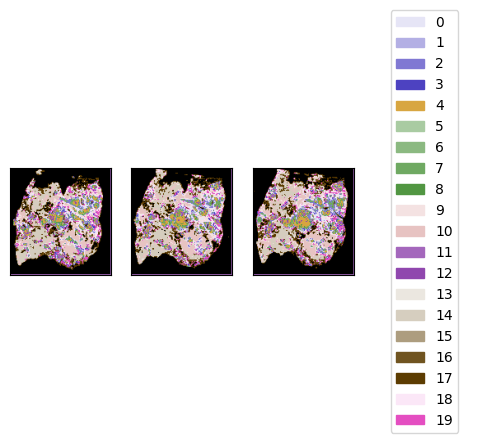

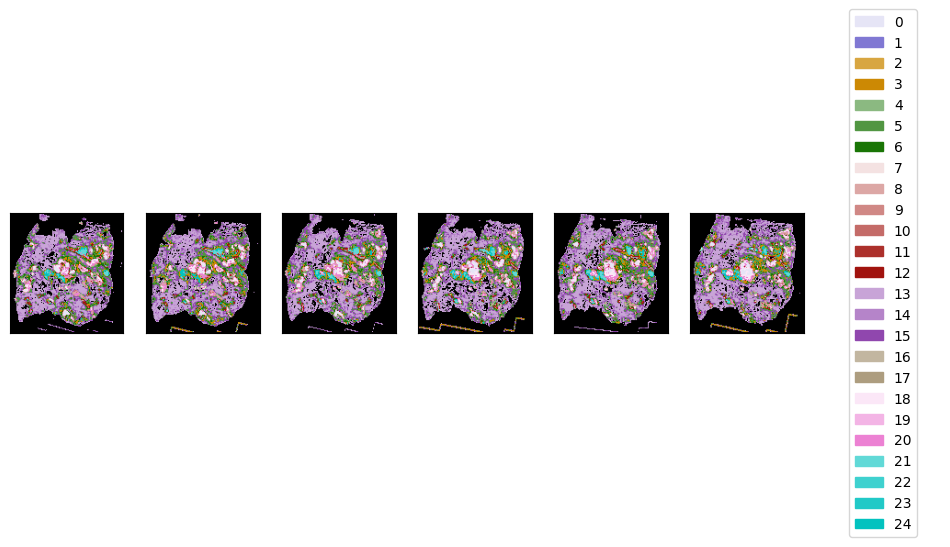

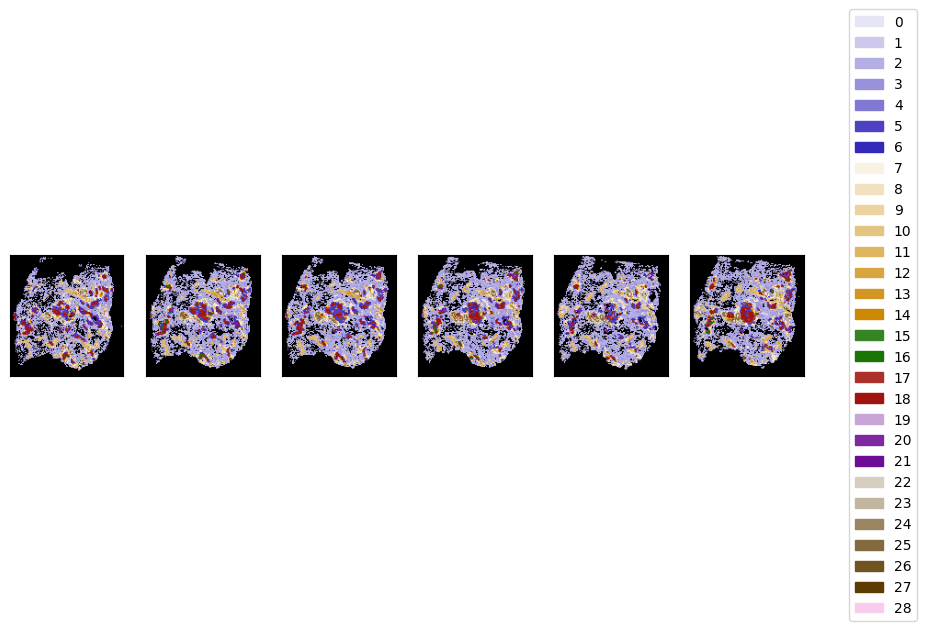

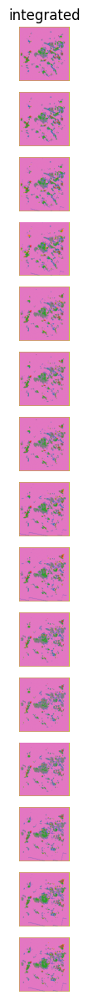

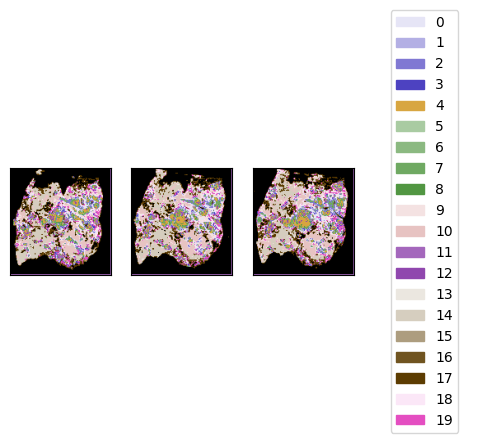

...

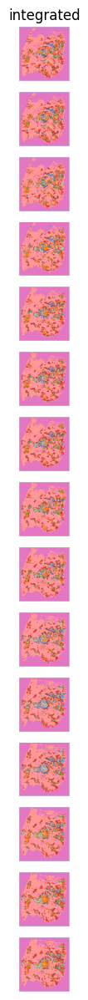

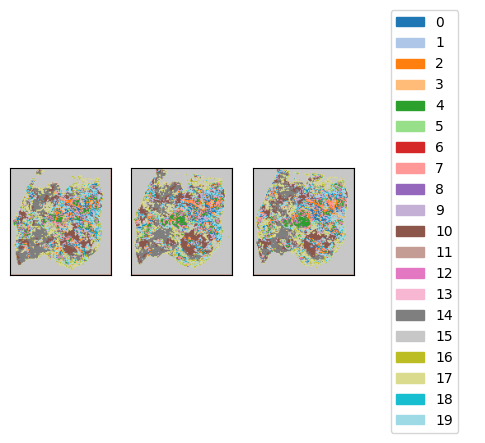

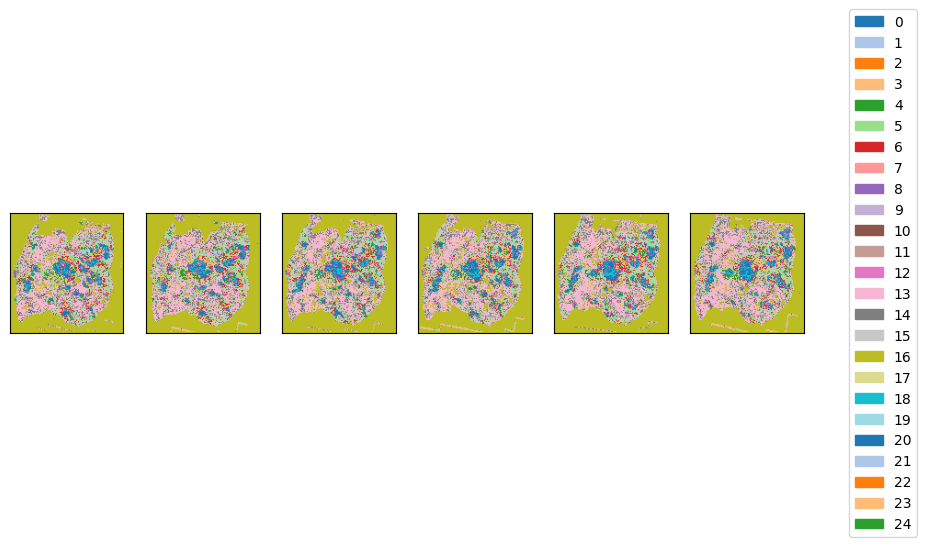

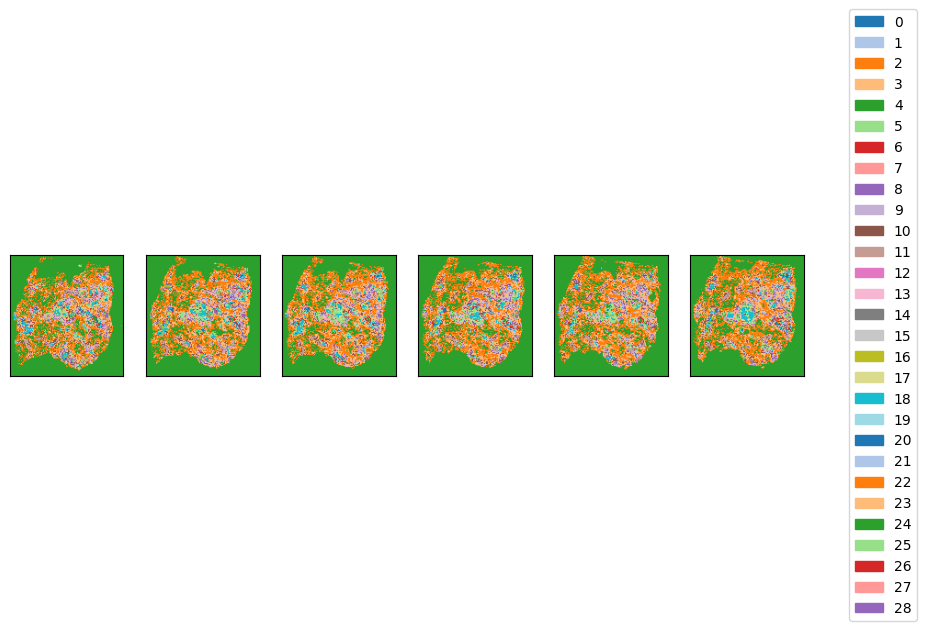

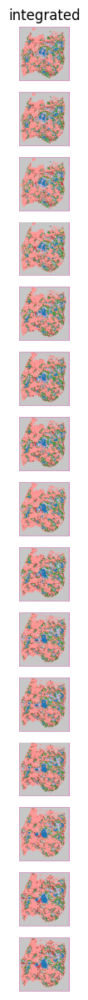

In [22]:
def save_nbhds(discard_max=False, use_hierarchy=True):
    for level in range(mushroom.num_levels):
        data = pickle.load(
            open(os.path.join(project_dir, case, 'mushroom_50res', f'nbhd_volumes_l{level}.pkl'), 'rb')
        )
        dtype_to_volume = data['probs']
        dtype_to_volume_labels = data['labeled']

        for dtype in mushroom.dtypes:
            mushroom.display_clusters(dtype, discard_max=discard_max, use_hierarchy=use_hierarchy)
            plt.savefig(os.path.join(fig_dir, f'nbhd_{dtype}_l{level}_bckrd{discard_max}_hcmap{use_hierarchy}.svg'), dpi=300)
            plt.savefig(os.path.join(fig_dir, f'nbhd_{dtype}_l{level}_bckrd{discard_max}_hcmap{use_hierarchy}.png'), dpi=300)

        mushroom.display_volumes(dtype_to_volume={k:v for k, v in dtype_to_volume_labels.items() if k=='integrated'},
                                 positions=mushroom.section_positions)

        plt.savefig(os.path.join(fig_dir, f'nbhd_integrated_l{level}_bckrd{discard_max}.svg'), dpi=300)
        plt.savefig(os.path.join(fig_dir, f'nbhd_integrated_l{level}_bckrd{discard_max}.png'), dpi=300)

fig_dir = os.path.join(out_dir, 'figures')
Path(fig_dir).mkdir(parents=True, exist_ok=True)

save_nbhds(discard_max=True, use_hierarchy=True)
save_nbhds(discard_max=True, use_hierarchy=False)
save_nbhds(discard_max=False, use_hierarchy=True)
save_nbhds(discard_max=False, use_hierarchy=False)


In [23]:
import shutil

In [24]:
fp = os.path.join(project_dir, case, 'mushroom_50res', f'outputs.pkl')
shutil.copy(fp, os.path.join(out_dir, 'outputs.pkl'))

'/data/estorrs/mushroom/data/projects/submission_v1/analysis/export/HT206B1/outputs.pkl'

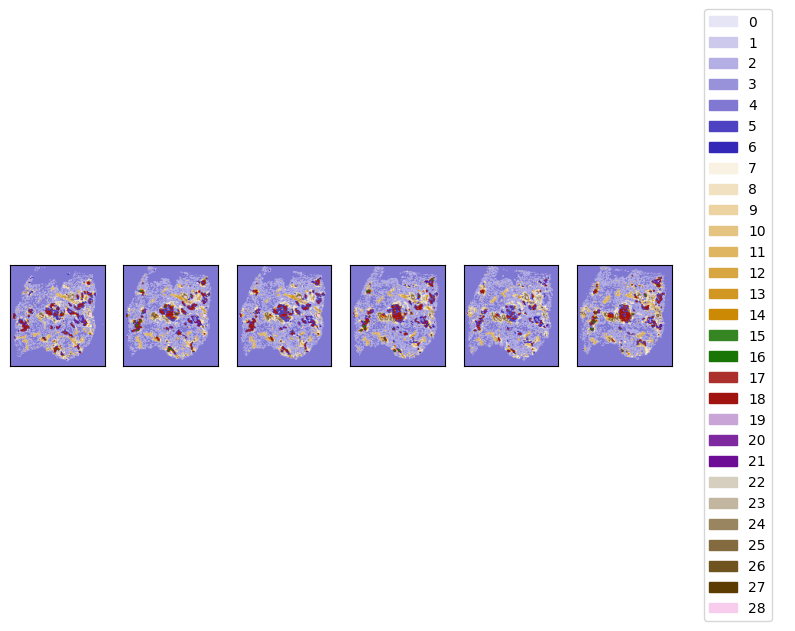

In [25]:
mushroom.display_clusters('xenium', figsize=(10, 5))

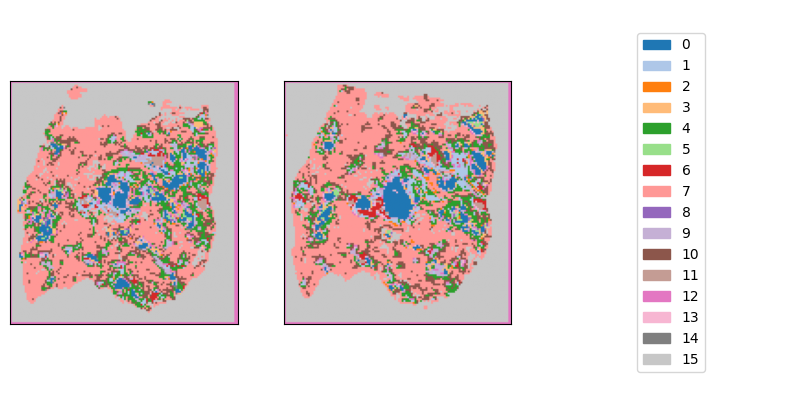

In [26]:
mushroom.display_clusters('integrated', figsize=(10, 5), section_idxs=[0, -1])

In [51]:
volume = outputs['dtype_to_volume']['integrated']
volume.shape

(25, 132, 124)

In [27]:
obj = sc.read_h5ad(
    os.path.join(project_dir, case, 'xenium_cell_typing', 'cell_typing_obj.h5ad')
)
obj

AnnData object with n_obs × n_vars = 681554 × 377
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'sid', 'n_counts', 'leiden', 'cell_type', 'cell_type_specific'
    var: 'n_cells'
    uns: 'cell_type_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [28]:
obj

AnnData object with n_obs × n_vars = 681554 × 377
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'sid', 'n_counts', 'leiden', 'cell_type', 'cell_type_specific'
    var: 'n_cells'
    uns: 'cell_type_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [29]:
mushroom.section_positions

array([ 0,  1,  3,  4,  8,  9, 10, 12, 13, 16, 17, 18, 20, 21, 24])

In [30]:
mushroom.section_ids

[('HT206B1-U1', 'xenium'),
 ('HT206B1-U2', 'multiplex'),
 ('HT206B1-U4', 'he'),
 ('HT206B1-U5', 'multiplex'),
 ('HT206B1-U8', 'xenium'),
 ('HT206B1-U9', 'xenium'),
 ('HT206B1-U10', 'multiplex'),
 ('HT206B1-U12', 'he'),
 ('HT206B1-U13', 'multiplex'),
 ('HT206B1-U16', 'xenium'),
 ('HT206B1-U17', 'xenium'),
 ('HT206B1-U18', 'multiplex'),
 ('HT206B1-U20', 'he'),
 ('HT206B1-U21', 'multiplex'),
 ('HT206B1-U24', 'xenium')]

In [32]:
sids = [x for (x, _) in mushroom.section_ids]
obj.obs['position'] = [mushroom.section_positions[sids.index(s)] for s in obj.obs['sid']]
obj.obs

,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,nucleus_area,sid,n_counts,leiden,cell_type,cell_type_specific,position
HT206B1-U1_aaaaeefm-1,1352.328735,856.673035,76,0,0,0,0,76,242.895478,35.447658,HT206B1-U1,39.0,7,Unlabeled,Unlabeled,0
HT206B1-U1_aaaagokl-1,1441.802612,871.474121,30,0,0,0,0,30,704.798776,22.397501,HT206B1-U1,20.0,7,Unlabeled,Unlabeled,0
HT206B1-U1_aaaaippd-1,1468.341553,860.412964,103,0,0,0,0,103,547.474395,48.452658,HT206B1-U1,61.0,7,Unlabeled,Unlabeled,0
HT206B1-U1_aaaajeja-1,1411.193359,855.234680,57,0,0,0,0,57,537.630332,29.938595,HT206B1-U1,44.0,7,Unlabeled,Unlabeled,0
HT206B1-U1_aaablpen-1,1449.760132,858.455505,24,0,0,0,0,24,182.792507,12.824375,HT206B1-U1,13.0,7,Unlabeled,Unlabeled,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT206B1-U24_oilkdgen-1,4190.450195,2562.225342,144,0,0,0,0,144,68.637502,36.892658,HT206B1-U24,144.0,0,Epithelial,Epithelial,24
HT206B1-U24_oilkljhi-1,4192.643555,2587.292480,166,0,0,0,0,166,89.635160,53.103752,HT206B1-U24,166.0,4,Epithelial,Epithelial,24
HT206B1-U24_oilkmkbb-1,4197.084473,2569.457031,163,0,0,0,0,163,89.770628,51.839377,HT206B1-U24,163.0,4,Epithelial,Epithelial,24
HT206B1-U24_oilkmpah-1,4197.412598,2578.949707,138,0,0,0,0,138,75.230315,44.117658,HT206B1-U24,138.0,3,Epithelial,Epithelial,24


###### cell type densities

In [33]:
mushroom.trainer_kwargs

{'accelerator': 'cpu',
 'batch_size': 128,
 'channel_mapping': {},
 'data_mask': None,
 'devices': 1,
 'input_resolution': 1.0,
 'log_base': 2.718281828459045,
 'log_dir': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/mushroom_50res/xenium_logs',
 'log_every_n_steps': 10,
 'logger_project': 'portobello',
 'logger_type': 'tensorboard',
 'lr': 0.0001,
 'max_epochs': 1,
 'num_workers': 0,
 'out_dir': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/mushroom_50res',
 'pct_expression': 0.05,
 'save_dir': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/mushroom_50res/xenium_chkpts',
 'save_every': 1,
 'steps_per_epoch': 1000,
 'target_resolution': 50,
 'tiling_method': 'grid',
 'tiling_radius': 1.0}

In [34]:
tiling_size = int(mushroom.trainer_kwargs['target_resolution'] / mushroom.trainer_kwargs['input_resolution'])
tiling_size

50

In [36]:
cell_types = sorted(set(obj.obs['cell_type_specific'].to_list()))
cell_types

['B cell',
 'CD4 T cell',
 'CD8 T cell',
 'Endothelial',
 'Epithelial',
 'Fibroblast',
 'Macrophage',
 'NK',
 'Normal Duct',
 'Plasma',
 'Unlabeled',
 'cDC',
 'pDC']

In [37]:
hots = np.asarray([[1. if ct == x else 0. for ct in cell_types]
                    for x in obj.obs['cell_type_specific']])
hots

array([[0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [38]:
import anndata

In [39]:
fraction_adata = anndata.AnnData(X=hots, obs=obj.obs.copy(), obsm=obj.obsm.copy(), uns=obj.uns)
fraction_adata.obs = obj.obs.copy()
fraction_adata.var.index = cell_types
fraction_adata

AnnData object with n_obs × n_vars = 681554 × 13
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'sid', 'n_counts', 'leiden', 'cell_type', 'cell_type_specific', 'position'
    uns: 'cell_type_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'spatial'

In [40]:
import mushroom.data.visium as visium

In [41]:
a = next(iter(mushroom.dtype_to_spore['xenium'].learner_data.dtype_to_section_to_adata['xenium'].values()))
size = visium.get_fullres_size(a)
size

(6530, 6054)

In [42]:
def tile_img(adata, tiling_size, size):
    n_rows, n_cols = size[-2] // tiling_size + 1, size[-1] // tiling_size + 1

    pts = adata.obsm['spatial'][:, [1, 0]]

    img = np.zeros((n_rows, n_cols, adata.shape[1]))
    for r in range(n_rows):
        r1, r2 = r * tiling_size, (r + 1) * tiling_size
        row_mask = ((pts[:, 0] >= r1) & (pts[:, 0] < r2))
        row_adata, row_pts = adata[row_mask], pts[row_mask]
        for c in range(n_cols):
            c1, c2 = c * tiling_size, (c + 1) * tiling_size
            col_mask = ((row_pts[:, 1] >= c1) & (row_pts[:, 1] < c2))
            img[r, c] = row_adata[col_mask].X.sum(0)
    return img

In [53]:
img_objects = {}

In [54]:
sids = sorted(set(fraction_adata.obs['sid']))
img_objects['cell_type_density'] = {}

for sid in sids:
    a = fraction_adata[fraction_adata.obs['sid']==sid]
    img = tile_img(a, tiling_size, size)
    
    # needs to be slightly scaled to match volume
    img = utils.rescale(img, size=(volume.shape[-2], volume.shape[-1]),
                        dim_order='h w c', target_dtype=img.dtype)
    img_objects['cell_type_density'][sid] = {
        'img': img,
        'channels': a.var.index.to_list()
    }

###### expression

In [62]:
# genes = [
#     'EPCAM',
#     'IL7R'
# ]

In [63]:
# channels = mushroom.dtype_to_spore['xenium'].dtype_to_channels['xenium']

In [64]:
# sid_to_exp = {}
# for sid in sids:
#     a = mushroom.dtype_to_spore['xenium'].learner_data.dtype_to_section_to_adata['xenium'][sid]
#     a = a[:, genes]
#     img = tile_img(a, tiling_size, size)
#     img = utils.rescale(img, size=(volume.shape[-2], volume.shape[-1]),
#                         dim_order='h w c', target_dtype=img.dtype)
#     sid_to_exp[sid] = img

In [58]:
channels = mushroom.dtype_to_spore['xenium'].dtype_to_channels['xenium']

In [60]:
# identify cells meeting criteria
from sklearn.neighbors import NearestNeighbors

criterias = [
    {
        'name': 'FN1_CD44',
        'source_ct': 'Epithelial',
        'source_gene': 'CD44',
        'target_ct': 'Fibroblast',
        'target_gene': 'FN1'
    }
    {
        'name': 'FN1_CD44',
        'source_ct': 'Epithelial',
        'source_gene': 'CD44',
        'target_ct': 'Fibroblast',
        'target_gene': 'FN1'
    }
]

data = []
idxs = []

for sid in sorted(set(obj.obs['sid'])):
    f = obj[obj.obs['sid']==sid]
    print(f.shape)
    idxs += f.obs.index.to_list()
    
    vals = []
    for criteria in criterias:
        nn = NearestNeighbors()

        target_mask = f[:, criteria['target_gene']].X.flatten() > 1
#         target_mask = f.obs['receptor_positive'].to_numpy()
        target_mask &= f.obs['cell_type_specific'] == criteria['target_ct']
        
        source_mask = f[:, criteria['source_gene']].X.flatten() > 1
#         source_mask = f.obs['ligand_positive'].to_numpy()
        source_mask &= f.obs['cell_type_specific'] == criteria['source_ct']
        
        mask = target_mask | source_mask
        
        target_mask, source_mask, mask = [x.to_numpy().astype(bool) for x in [target_mask, source_mask, mask]]
        
        nn.fit(f.obsm['spatial'])
        g = nn.radius_neighbors_graph(radius=10) # 10 micron radius
        gf = g[:, target_mask]
        v = np.asarray(gf.sum(1)).flatten()
        v[~source_mask] = 0.
        vals.append(v)
    print(vals[0].shape)
    vals = np.stack(vals, axis=1)
    print(vals.shape)
    data.append(vals)
#     break

data = np.concatenate(data, axis=0)


(113933, 377)


KeyError: 'FN1'

In [419]:
data.shape

(477956, 1)

In [420]:
# hots = np.asarray([[1. if ct == x else 0. for ct in cell_types]
#                     for x in xenium.obs['cell_type_specific']])
# hots

In [421]:
import anndata

In [422]:
fraction_adata = anndata.AnnData(X=data, obs=xenium[idxs].obs.copy(), obsm=xenium[idxs].obsm.copy(), uns=xenium.uns)
# fraction_adata.obs = xenium.obs.copy()
fraction_adata.var.index = [x['name'] for x in criterias]
fraction_adata

AnnData object with n_obs × n_vars = 477956 × 1
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'sid', 'n_counts', 'leiden', 'cell_type', 'cell_type_specific', 'position', 'ligand_positive', 'receptor_positive', 'both'
    uns: 'cell_type_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'spatial'

In [423]:
import mushroom.data.visium as visium

In [424]:
a = next(iter(mushroom.dtype_to_spore['xenium'].learner_data.dtype_to_section_to_adata['xenium'].values()))
size = visium.get_fullres_size(a)
size

(5085, 3642)

In [425]:
def tile_img(adata, tiling_size, size):
    n_rows, n_cols = size[-2] // tiling_size + 1, size[-1] // tiling_size + 1

    pts = adata.obsm['spatial'][:, [1, 0]]

    img = np.zeros((n_rows, n_cols, adata.shape[1]))
    for r in range(n_rows):
        r1, r2 = r * tiling_size, (r + 1) * tiling_size
        row_mask = ((pts[:, 0] >= r1) & (pts[:, 0] < r2))
        row_adata, row_pts = adata[row_mask], pts[row_mask]
        for c in range(n_cols):
            c1, c2 = c * tiling_size, (c + 1) * tiling_size
            col_mask = ((row_pts[:, 1] >= c1) & (row_pts[:, 1] < c2))
            img[r, c] = row_adata[col_mask].X.sum(0)
    return img

In [426]:
a

View of AnnData object with n_obs × n_vars = 102724 × 477
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'ppm', 'spatial', 'log1p'
    obsm: 'spatial'

In [427]:
sids = sorted(set(fraction_adata.obs['sid']))

sid_to_img = {}
for sid in sids:
    a = fraction_adata[fraction_adata.obs['sid']==sid]
    img = tile_img(a, tiling_size, size)
    sid_to_img[sid] = img

In [428]:
for sid, img in sid_to_img.items():
    sid_to_img[sid] = utils.rescale(img, size=(volume.shape[-2], volume.shape[-1]), dim_order='h w c', target_dtype=img.dtype)
    


In [429]:
img = sid_to_img[sids[0]]
img.shape


(100, 76, 1)

In [430]:
img.min((0, 1))

array([0.])

HT413C1-Th1k4A1-U19


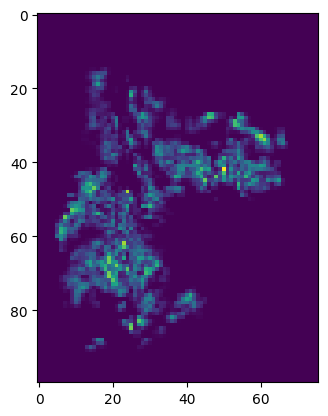

HT413C1-Th1k4A1-U2


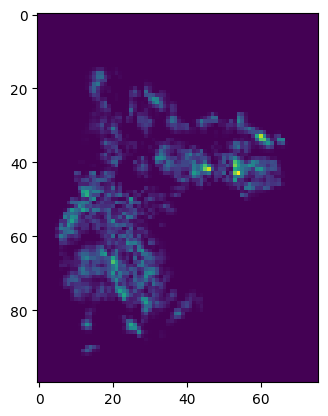

HT413C1-Th1k4A1-U25


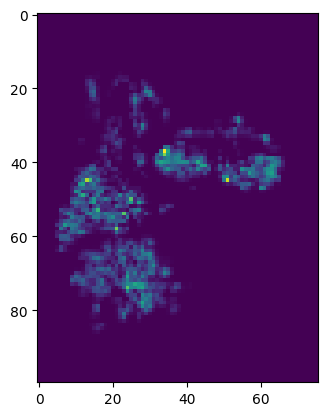

HT413C1-Th1k4A1-U36


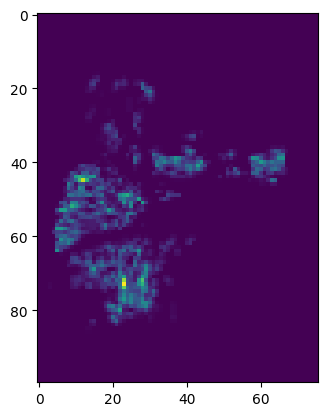

HT413C1-Th1k4A1-U9


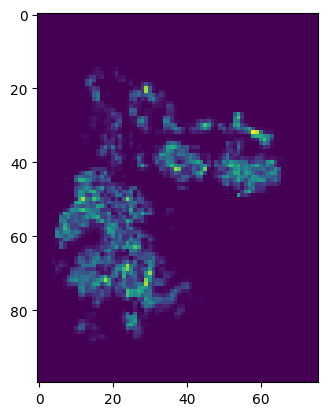

In [431]:
for sid, img in sid_to_img.items():
    print(sid)
    plt.imshow(img[..., 0])
    plt.show()

HT413C1-Th1k4A1-U19


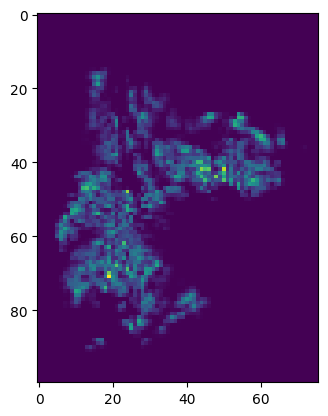

HT413C1-Th1k4A1-U2


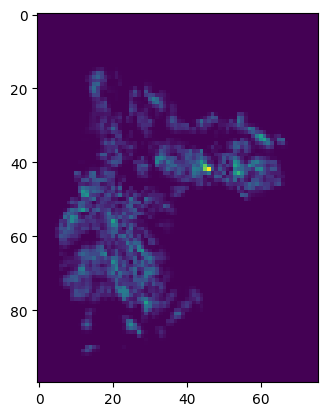

HT413C1-Th1k4A1-U25


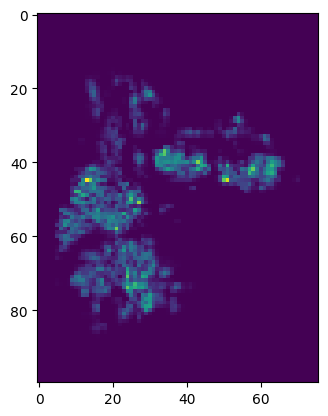

HT413C1-Th1k4A1-U36


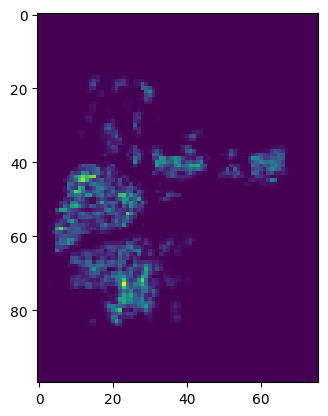

HT413C1-Th1k4A1-U9


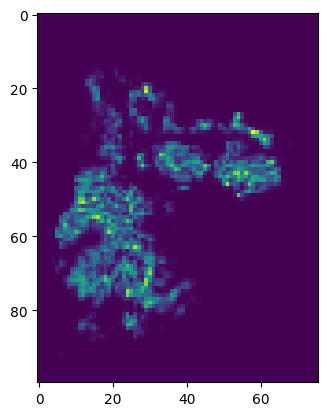

In [343]:
for sid, img in sid_to_img.items():
    print(sid)
    plt.imshow(img[..., 0])
    plt.show()

In [344]:
volume.shape

(3, 5, 100, 76)

In [345]:
order, positions = zip(*[(sid, pos)
                         for (sid, _), pos in zip(mushroom.section_ids, mushroom.section_positions)
                         if sid in sids])
order, positions

(('HT413C1-Th1k4A1-U19',
  'HT413C1-Th1k4A1-U2',
  'HT413C1-Th1k4A1-U9',
  'HT413C1-Th1k4A1-U25',
  'HT413C1-Th1k4A1-U36'),
 (5, 10, 17, 24, 35))

In [346]:
v = np.stack([sid_to_img[sid] for sid in order])
v = rearrange(v, 'n h w c -> c n h w')
v.shape

(1, 5, 100, 76)

In [347]:
positions = [0, *positions, mushroom.section_positions[-1]]
positions

[0, 5, 10, 17, 24, 35, 41]

In [348]:

v = np.concatenate((
    v[:, :1],
    v,
    v[:, -1:],
), axis=1)
interpolated = utils.get_interpolated_volume(v, positions, method='linear')
interpolated.shape

(1, 42, 100, 76)

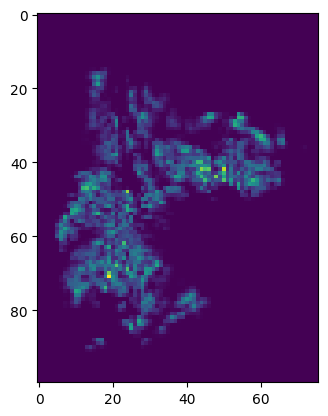

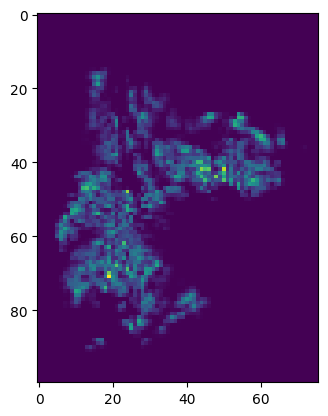

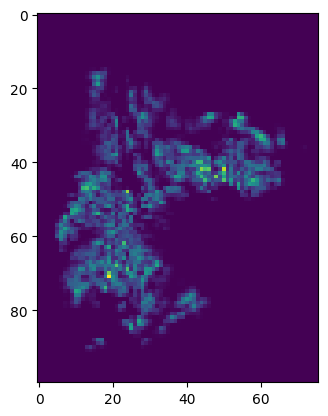

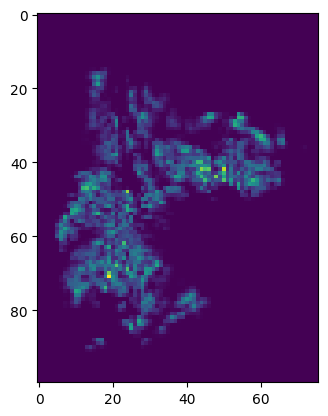

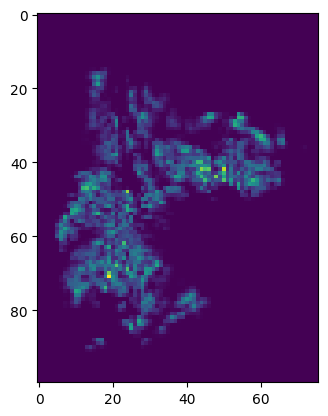

...

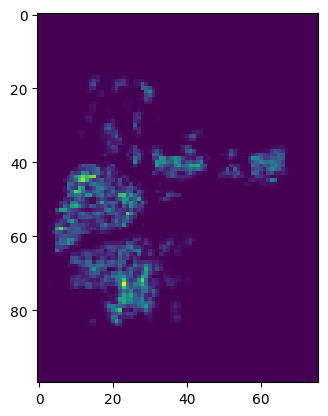

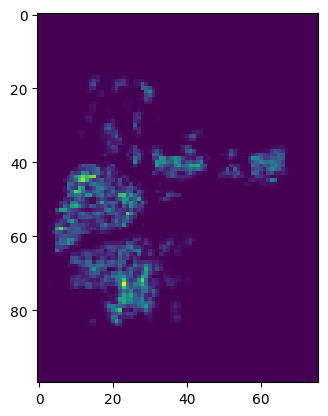

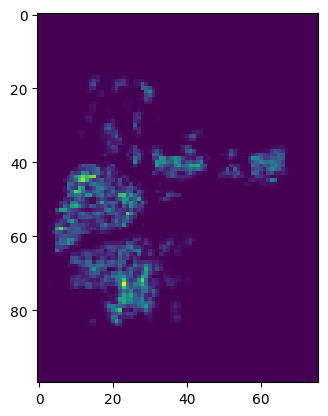

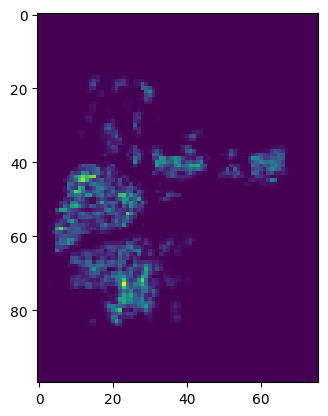

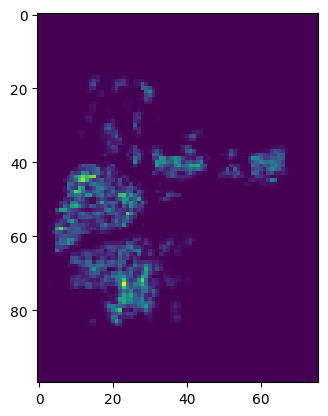

In [349]:
for x in rearrange(interpolated, 'c n h w -> n h w c'):
    plt.imshow(x[..., 0])
    plt.show()

In [350]:
tifffile.imwrite('/data/estorrs/sandbox/ht413_fn1_vol.tif', interpolated)

In [435]:
out_dir

'/data/estorrs/mushroom/data/projects/submission_v1/analysis/export/HT413C1-Th1k4A1'

In [ ]:
'/data/estorrs/mushroom/data/projects/submission_v1/analysis/export/HT413C1-Th1k4A1/barcodes_to_nbhds/HT413C1-Th1k4A1-U19_xenium_barcode_to_nbhds.txt'

'/data/estorrs/mushroom/data/projects/submission_v1/analysis/export/HT413C1-Th1k4A1/barcodes_to_nbhds/HT413C1-Th1k4A1-U19_xenium_barcode_to_nbhds.txt'


In [460]:
col = 'nbhd_crossdtype_integrated_level2'
fps = sorted(utils.listfiles(os.path.join(out_dir, 'barcodes_to_nbhds')))

dfs = []
for fp in fps:
    if 'xenium' in fp or 'cosmx' in fp:
        sample = fp.split('/')[-1].split('_')[0]
        df = pd.read_csv(fp, sep='\t')
#         print(sample, df.shape, df.columns)
        indexer = 'cell_id' if 'cell_id' in df.columns else 'cell'

        df.index = [f'{sample}_{cid}' for cid in df[indexer]]
        dfs.append(df)
merged = pd.concat(dfs)
merged
barcode_to_nbhd = {cid:nbhd for cid, nbhd in zip(merged.index.to_list(), merged[col])}
list(barcode_to_nbhd.items())[:10]

[('HT413C1-Th1k4A1-U19_aaaaahcn-1', 'nbhd 6'),
 ('HT413C1-Th1k4A1-U19_aaaaibcn-1', 'nbhd 6'),
 ('HT413C1-Th1k4A1-U19_aaabchmf-1', 'nbhd 6'),
 ('HT413C1-Th1k4A1-U19_aaacfenh-1', 'nbhd 6'),
 ('HT413C1-Th1k4A1-U19_aaachjof-1', 'nbhd 6'),
 ('HT413C1-Th1k4A1-U19_aaackgcj-1', 'nbhd 6'),
 ('HT413C1-Th1k4A1-U19_aaacmimd-1', 'nbhd 6'),
 ('HT413C1-Th1k4A1-U19_aaaddnlp-1', 'nbhd 6'),
 ('HT413C1-Th1k4A1-U19_aaadomfi-1', 'nbhd 6'),
 ('HT413C1-Th1k4A1-U19_aaaedcii-1', 'nbhd 6')]

In [462]:
xenium.obs['nbhd'] = [barcode_to_nbhd[x] for x in xenium.obs.index.to_list()]
cosmx.obs['nbhd'] = [barcode_to_nbhd[x] for x in cosmx.obs.index.to_list()]

In [463]:
xenium.obs

,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,nucleus_area,sid,n_counts,leiden,cell_type,cell_type_specific,position,ligand_positive,receptor_positive,both,nbhd
HT413C1-Th1k4A1-U19_aaaaahcn-1,1017.725281,1705.606323,135,0,0,0,0,135,121.289692,6.276719,HT413C1-Th1k4A1-U19,135.0,14,Fibroblast,Fibroblast,5,True,True,True,nbhd 6
HT413C1-Th1k4A1-U19_aaaaibcn-1,1017.245911,1694.341797,78,0,0,0,0,78,112.980942,8.218438,HT413C1-Th1k4A1-U19,78.0,15,Endothelial,Endothelial,5,True,False,False,nbhd 6
HT413C1-Th1k4A1-U19_aaabchmf-1,1020.081482,1686.661011,24,0,0,0,0,24,90.086722,25.152032,HT413C1-Th1k4A1-U19,24.0,12,Unlabeled,Unlabeled,5,NaN,NaN,NaN,nbhd 6
HT413C1-Th1k4A1-U19_aaacfenh-1,1027.807739,1693.212524,56,0,0,0,0,56,55.767971,18.197969,HT413C1-Th1k4A1-U19,56.0,14,Fibroblast,Fibroblast,5,True,False,False,nbhd 6
HT413C1-Th1k4A1-U19_aaachjof-1,1029.762085,1702.284912,91,0,0,0,0,91,178.683288,21.810470,HT413C1-Th1k4A1-U19,91.0,14,Fibroblast,Fibroblast,5,True,True,True,nbhd 6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT413C1-Th1k4A1-U36_oilbbedb-1,2570.571777,1187.463989,113,0,0,0,0,113,82.274690,19.146251,HT413C1-Th1k4A1-U36,113.0,0,Epithelial,Epithelial,35,True,True,True,nbhd 8
HT413C1-Th1k4A1-U36_oilbldfc-1,2561.678467,1191.457397,130,0,0,0,0,130,27.771095,14.179063,HT413C1-Th1k4A1-U36,130.0,0,Epithelial,Epithelial,35,True,True,True,nbhd 8
HT413C1-Th1k4A1-U36_oilblnpd-1,2571.185059,1193.600220,154,1,0,0,0,155,95.731253,20.455782,HT413C1-Th1k4A1-U36,154.0,11,Macrophage,Macrophage,35,True,True,True,nbhd 8
HT413C1-Th1k4A1-U36_oilbplcp-1,2549.230713,1195.201538,181,0,0,0,0,181,79.113753,25.377813,HT413C1-Th1k4A1-U36,181.0,8,Epithelial,Epithelial,35,True,True,True,nbhd 8


In [522]:
spore = mushroom.dtype_to_spore['cosmx']
spore.true_pixels[0].shape

(100, 76, 1000)

In [524]:
channels = spore.dtype_to_channels['cosmx']
channels

['AATK',
 'ABL1',
 'ABL2',
 'ACACB',
 'ACE',
 'ACKR1',
 'ACKR3',
 'ACKR4',
 'ACP5',
 'ACTA2',
 'ACTG2',
 'ACVR1',
 'ACVR1B',
 'ACVR2A',
 'ACVRL1',
 'ADGRA2',
 'ADGRA3',
 'ADGRE2',
 'ADGRE5',
 'ADGRF1',
 'ADGRF3',
 'ADGRF5',
 'ADGRG1',
 'ADGRG3',
 'ADGRG5',
 'ADGRG6',
 'ADGRL1',
 'ADGRL2',
 'ADGRL4',
 'ADGRV1',
 'ADIPOQ',
 'ADIRF',
 'ADM2',
 'AGR2',
 'AHI1',
 'AHR',
 'AIF1',
 'AKT1',
 'ALCAM',
 'ALOX5AP',
 'ANGPT1',
 'ANGPT2',
 'ANGPTL1',
 'ANKRD1',
 'ANXA1',
 'ANXA2',
 'ANXA4',
 'APOA1',
 'APOC1',
 'APOD',
 'APOE',
 'APP',
 'AQP3',
 'AR',
 'AREG',
 'ARF1',
 'ARG1',
 'ARHGDIB',
 'ARID5B',
 'ATF3',
 'ATG10',
 'ATG12',
 'ATG5',
 'ATM',
 'ATP5F1B',
 'ATP5F1E',
 'ATR',
 'AXL',
 'AZGP1',
 'AZU1',
 'B2M',
 'B3GNT7',
 'BAG3',
 'BASP1',
 'BAX',
 'BBLN',
 'BCL2',
 'BCL2L1',
 'BECN1',
 'BEST1',
 'BGN',
 'BID',
 'BIRC3',
 'BIRC5',
 'BMP1',
 'BMP2',
 'BMP3',
 'BMP4',
 'BMP5',
 'BMP7',
 'BMPR1A',
 'BMPR2',
 'BRAF',
 'BRCA1',
 'BST1',
 'BST2',
 'BTF3',
 'BTG1',
 'BTK',
 'C11orf96',
 'C1QA',
 'C1QB',


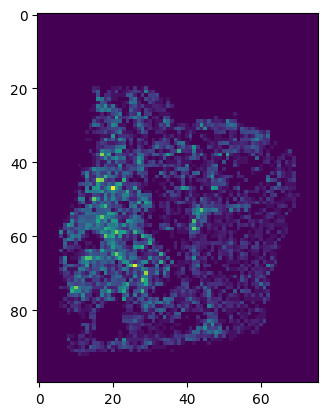

In [525]:
plt.imshow(spore.true_pixels[0][..., channels.index('TGFB1')])

In [557]:
tumor_nbhds = [f'nbhd {x}' for x in [5,4,6,0,12]]
exclude = [f'nbhd {x}' for x in [10, 11]]
def get_label(x):
    if x in tumor_nbhds:
        return 'yes'
    elif x in exclude:
        return 'other'
    return 'no'

In [558]:
xenium.obs['tumor_volume'] = [get_label(x) for x in xenium.obs['nbhd']]
cosmx.obs['tumor_volume'] = [get_label(x) for x in cosmx.obs['nbhd']]

In [559]:
set(cosmx.obs['nbhd'])

{'nbhd 0',
 'nbhd 1',
 'nbhd 10',
 'nbhd 11',
 'nbhd 12',
 'nbhd 13',
 'nbhd 14',
 'nbhd 2',
 'nbhd 3',
 'nbhd 4',
 'nbhd 5',
 'nbhd 6',
 'nbhd 7',
 'nbhd 8',
 'nbhd 9'}

In [560]:
set(cosmx.obs['tumor_volume'])

{'no', 'other', 'yes'}

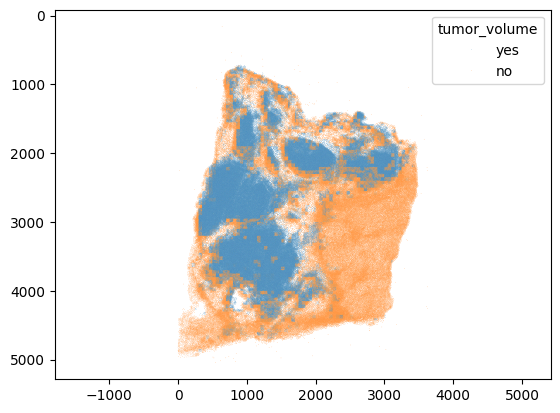

In [481]:
sns.scatterplot(xenium.obs, x=xenium.obsm['spatial'][:, 0], y=xenium.obsm['spatial'][:, 1], s=.1, hue='tumor_volume')
plt.axis('equal')
plt.gca().invert_yaxis()

In [561]:
cafs = xenium[xenium.obs['cell_type_specific']=='Fibroblast']
cafs

View of AnnData object with n_obs × n_vars = 60946 × 477
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'sid', 'n_counts', 'leiden', 'cell_type', 'cell_type_specific', 'position', 'ligand_positive', 'receptor_positive', 'both', 'nbhd', 'tumor_volume'
    var: 'n_cells'
    uns: 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [562]:
sc.tl.rank_genes_groups(cafs, groupby='tumor_volume')

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
... storing 'nbhd' as categorical
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
... storing 'tumor_volume' as categorical


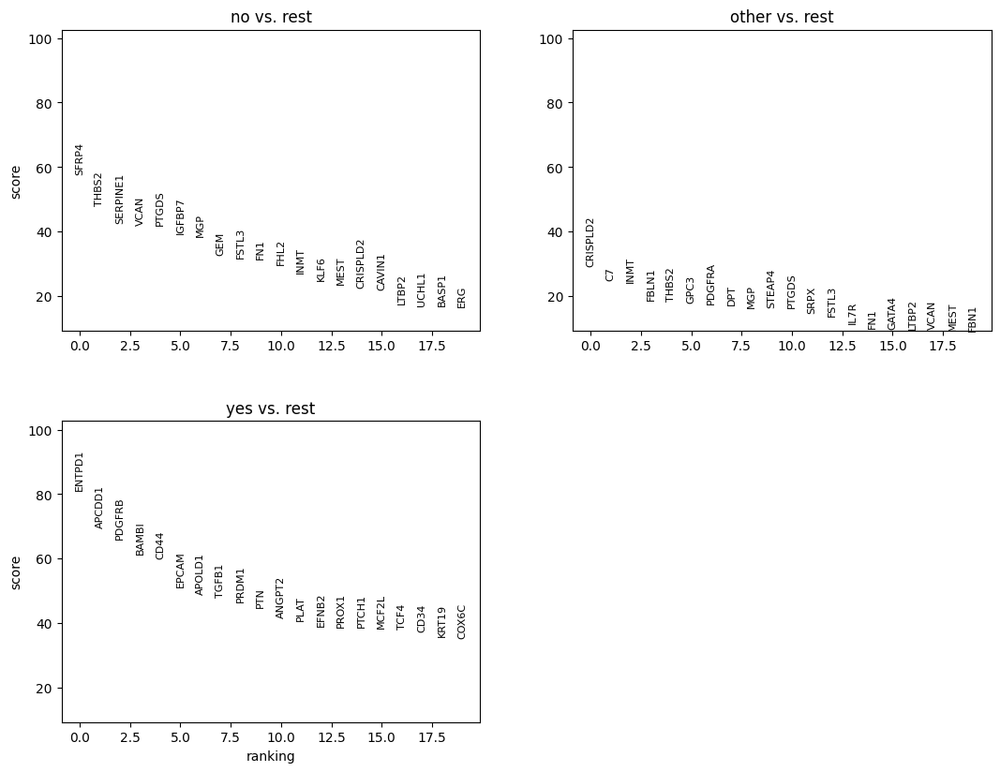

In [563]:
sc.pl.rank_genes_groups(cafs, ncols=2)

categories: no, other, yes
var_group_labels: yes


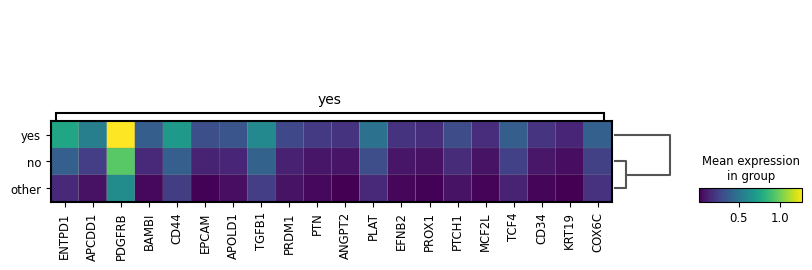

In [566]:
sc.pl.rank_genes_groups_matrixplot(cafs, groups=['yes'], n_genes=20)

In [519]:
cafs = cosmx[cosmx.obs['cell_type_specific']=='Fibroblast']
sc.tl.rank_genes_groups(cafs, groupby='tumor_volume')

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
... storing 'nbhd' as categorical
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
... storing 'tumor_volume' as categorical


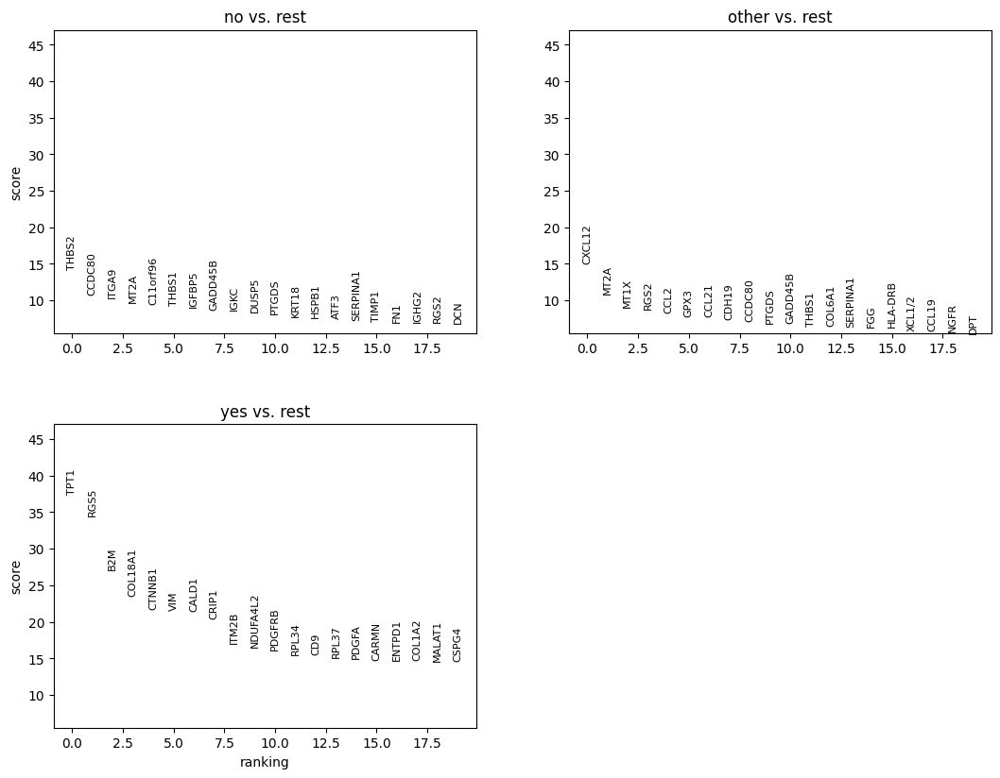

In [520]:
sc.pl.rank_genes_groups(cafs, ncols=2)

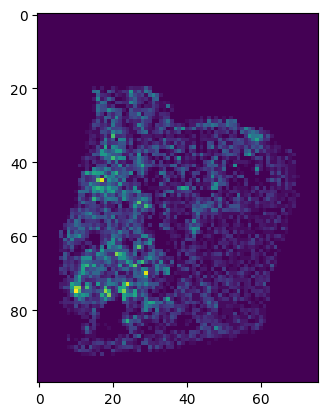

In [532]:
plt.imshow(spore.true_pixels[0][..., channels.index('PDGFRB')])

nbhd 0


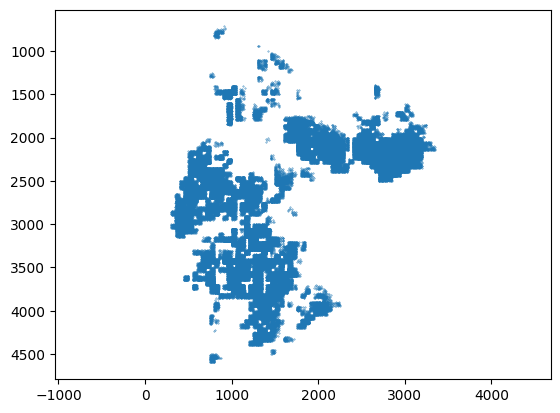

nbhd 1


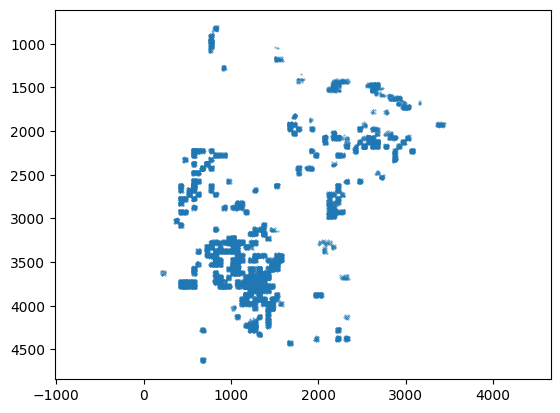

nbhd 10


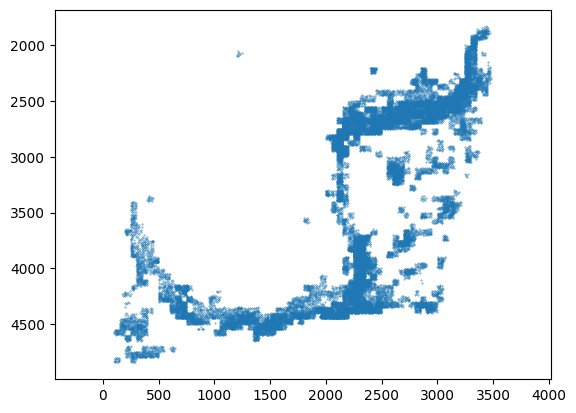

nbhd 11


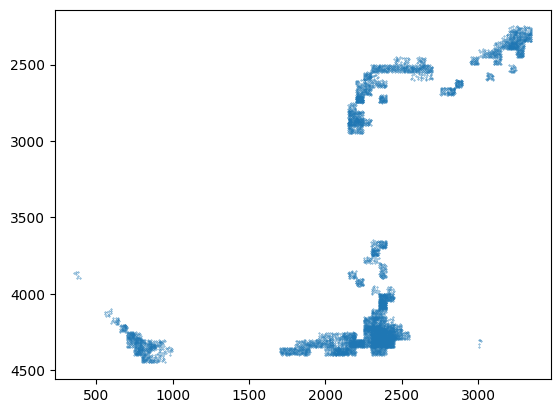

nbhd 12


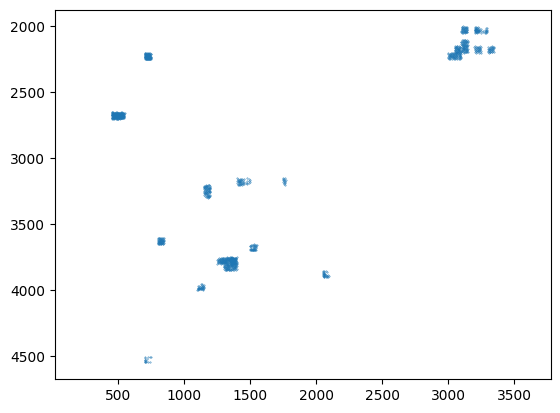

nbhd 13


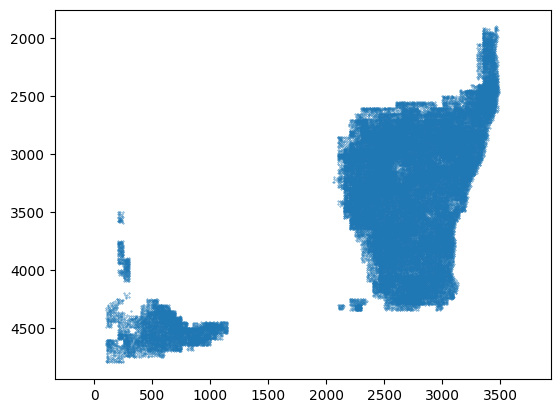

nbhd 14


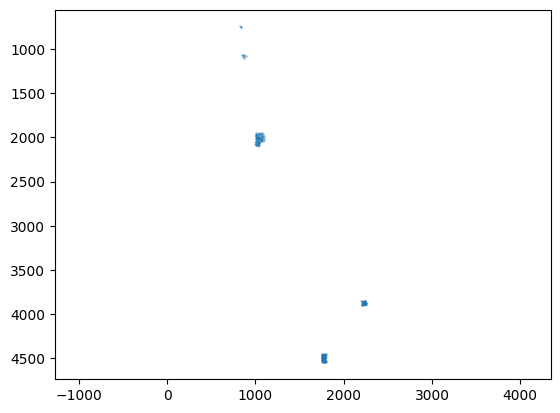

nbhd 2


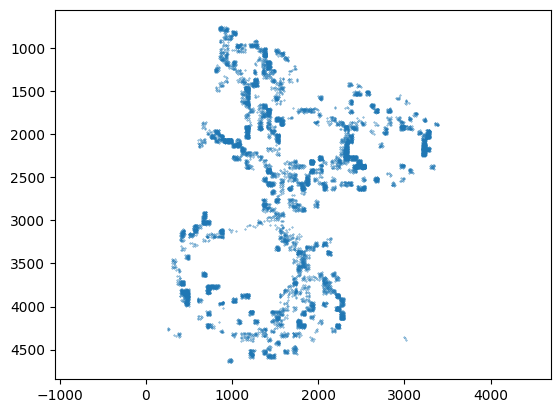

nbhd 3


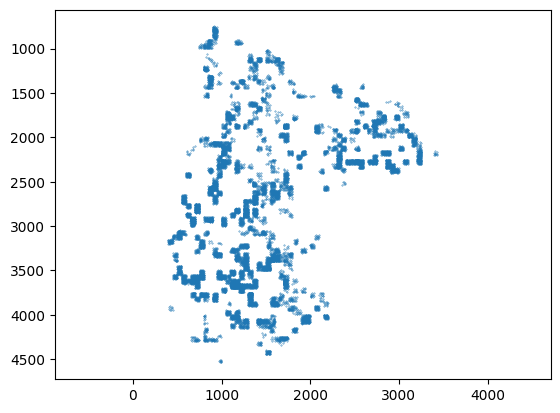

nbhd 4


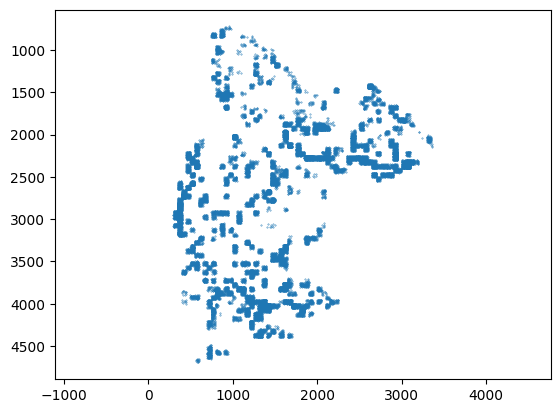

nbhd 5


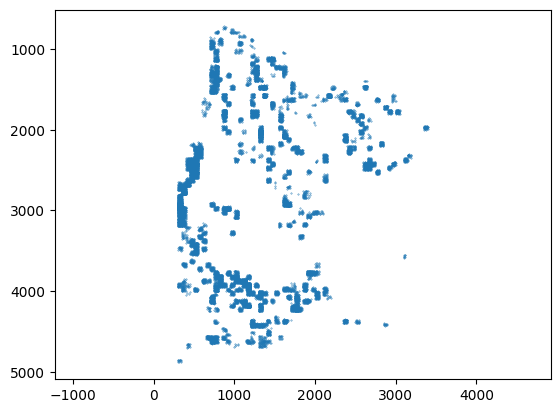

nbhd 6


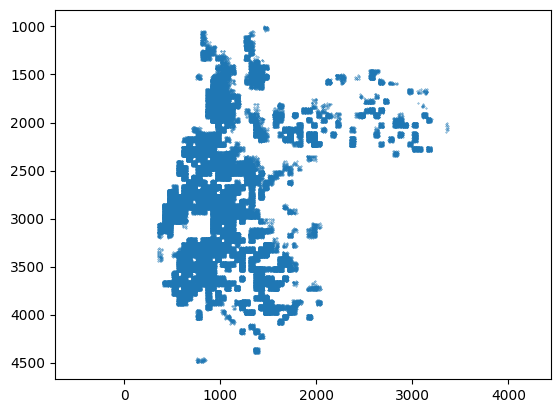

nbhd 7


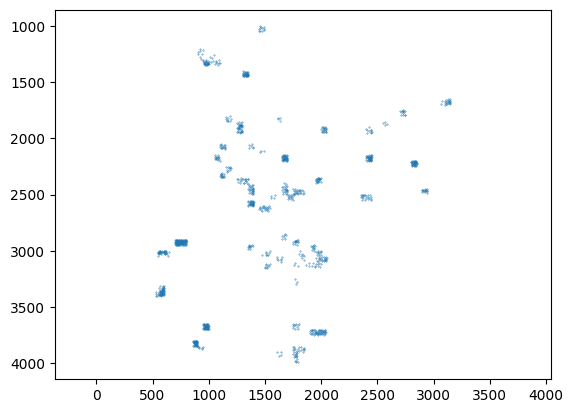

nbhd 8


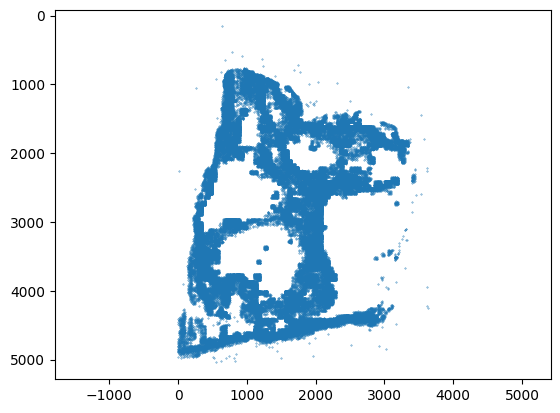

nbhd 9


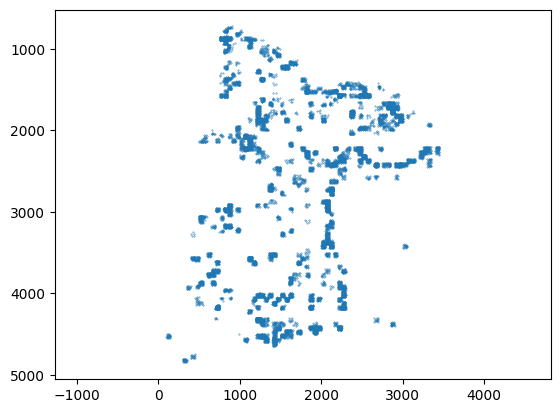

In [507]:
for ct in sorted(set(xenium.obs['nbhd'])):
    print(ct)
    f = xenium[xenium.obs['nbhd']==ct]
    plt.scatter(f.obsm['spatial'][:, 0], f.obsm['spatial'][:, 1], s=.1)
    plt.axis('equal')
    plt.gca().invert_yaxis()
    plt.show()

<Axes: >

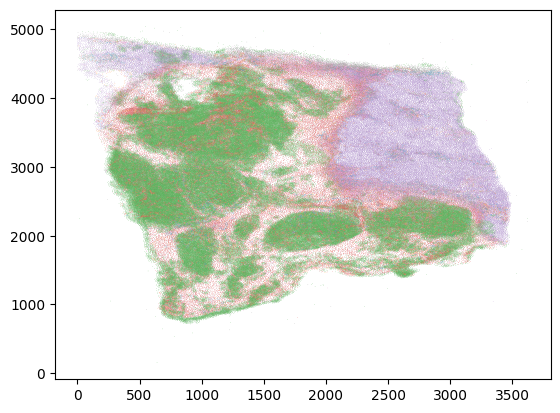

In [505]:
sns.scatterplot(
    xenium.obs, x=xenium.obsm['spatial'][:, 0], y=xenium.obsm['spatial'][:, 1], hue='cell_type_specific',
    s=.1, legend=None)

In [475]:
xenium

AnnData object with n_obs × n_vars = 477956 × 477
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'sid', 'n_counts', 'leiden', 'cell_type', 'cell_type_specific', 'position', 'ligand_positive', 'receptor_positive', 'both', 'nbhd'
    var: 'n_cells'
    uns: 'cell_type_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [489]:
'NCL' in cosmx.var.index

False

In [486]:
cosmx.var.index

Index(['AATK', 'ABL1', 'ABL2', 'ACACB', 'ACE', 'ACKR1', 'ACKR3', 'ACKR4',
       'ACP5', 'ACTA2',
       ...
       'WNT7A', 'WNT7B', 'WNT9A', 'XBP1', 'XCL1/2', 'XKR4', 'YBX3', 'YES1',
       'ZBTB16', 'ZFP36'],
      dtype='object', name='gene', length=1000)

In [322]:
img = spore.true_pixels[0]
img.shape

(100, 76, 477)

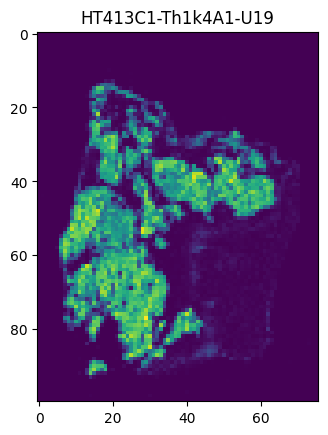

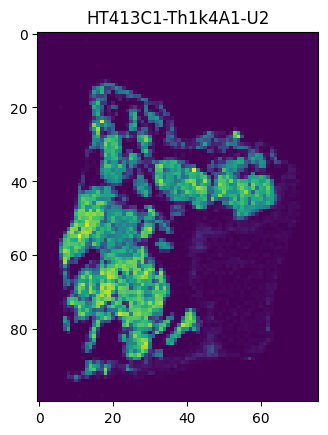

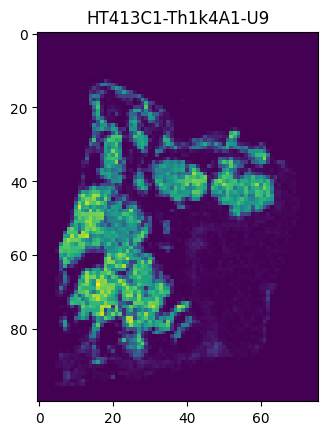

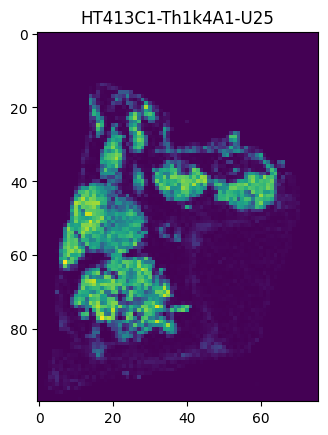

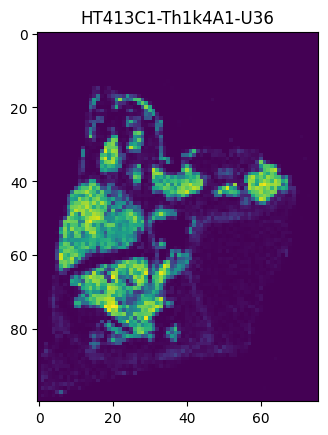

In [326]:
for (sid, _), img in zip(spore.section_ids, spore.true_pixels):
    plt.imshow(img[..., spore.dtype_to_channels['xenium'].index('CD44')])
    plt.title(sid)
    plt.show()

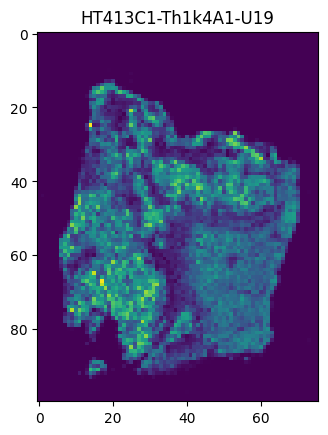

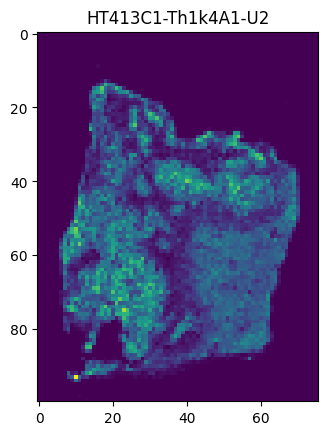

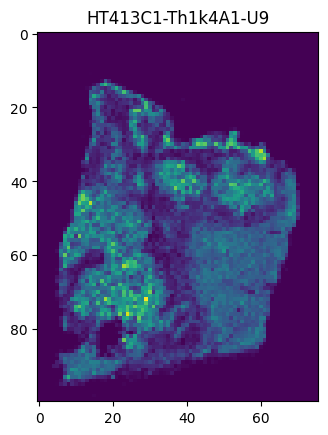

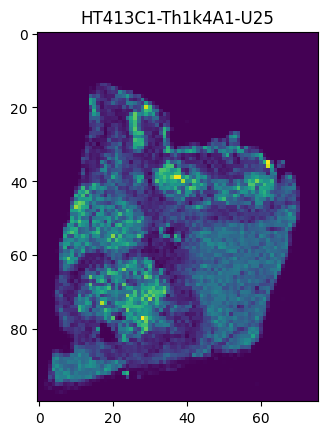

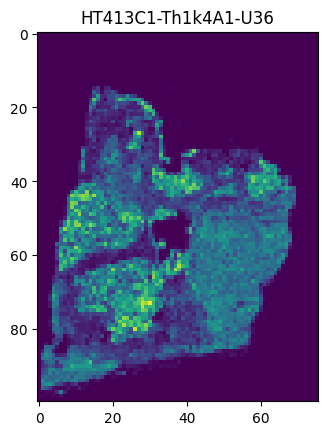

In [327]:
for (sid, _), img in zip(spore.section_ids, spore.true_pixels):
    plt.imshow(img[..., spore.dtype_to_channels['xenium'].index('FN1')])
    plt.title(sid)
    plt.show()

In [434]:
out_dir

'/data/estorrs/mushroom/data/projects/submission_v1/analysis/export/HT413C1-Th1k4A1'

In [541]:
mushroom.integrated_clusters[-1].shape

(28, 100, 76)

In [548]:
result = mushroom.calculate_cluster_intensities(projection_dtype='integrated')

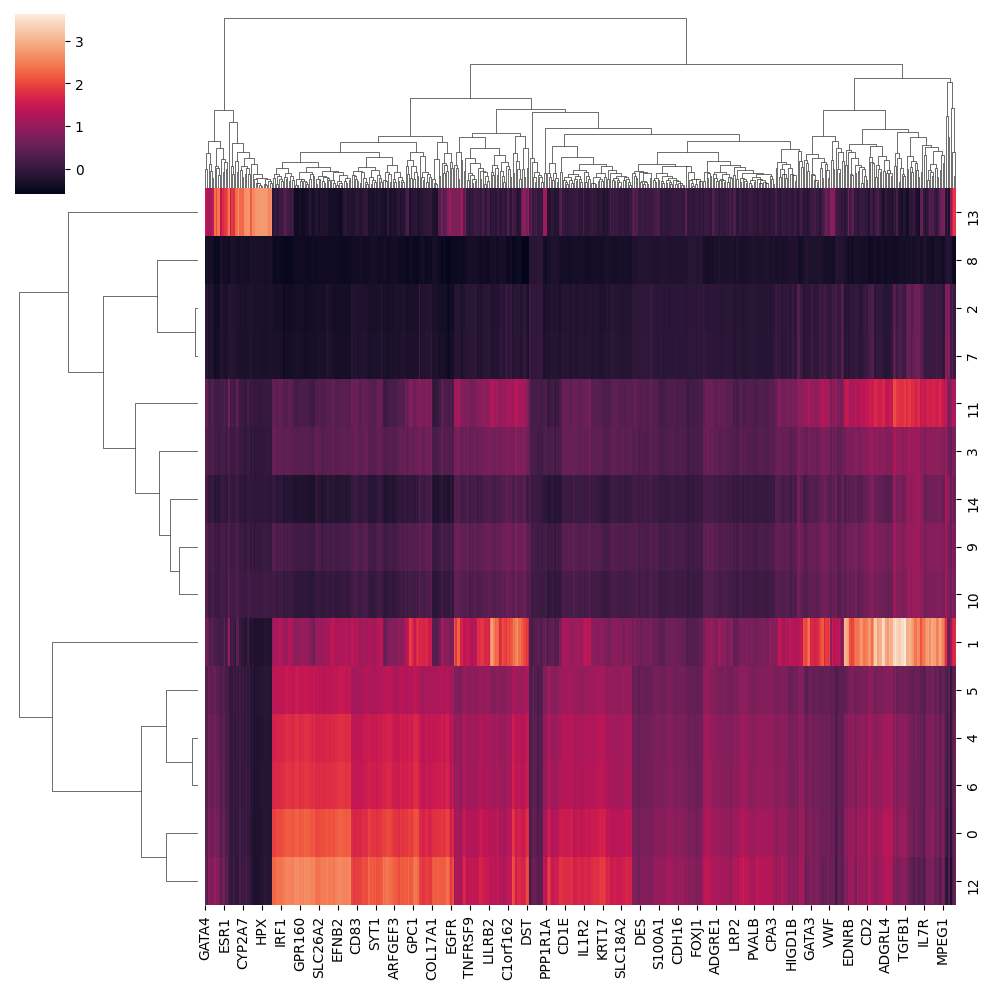

In [550]:
sns.clustermap(result['xenium'])

In [549]:
result.keys()

dict_keys(['cosmx', 'he', 'multiplex', 'xenium'])

In [43]:
dtype_to_df = mushroom.calculate_cluster_intensities()
dtype_to_df.keys()

dict_keys(['cosmx', 'he', 'multiplex', 'xenium'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


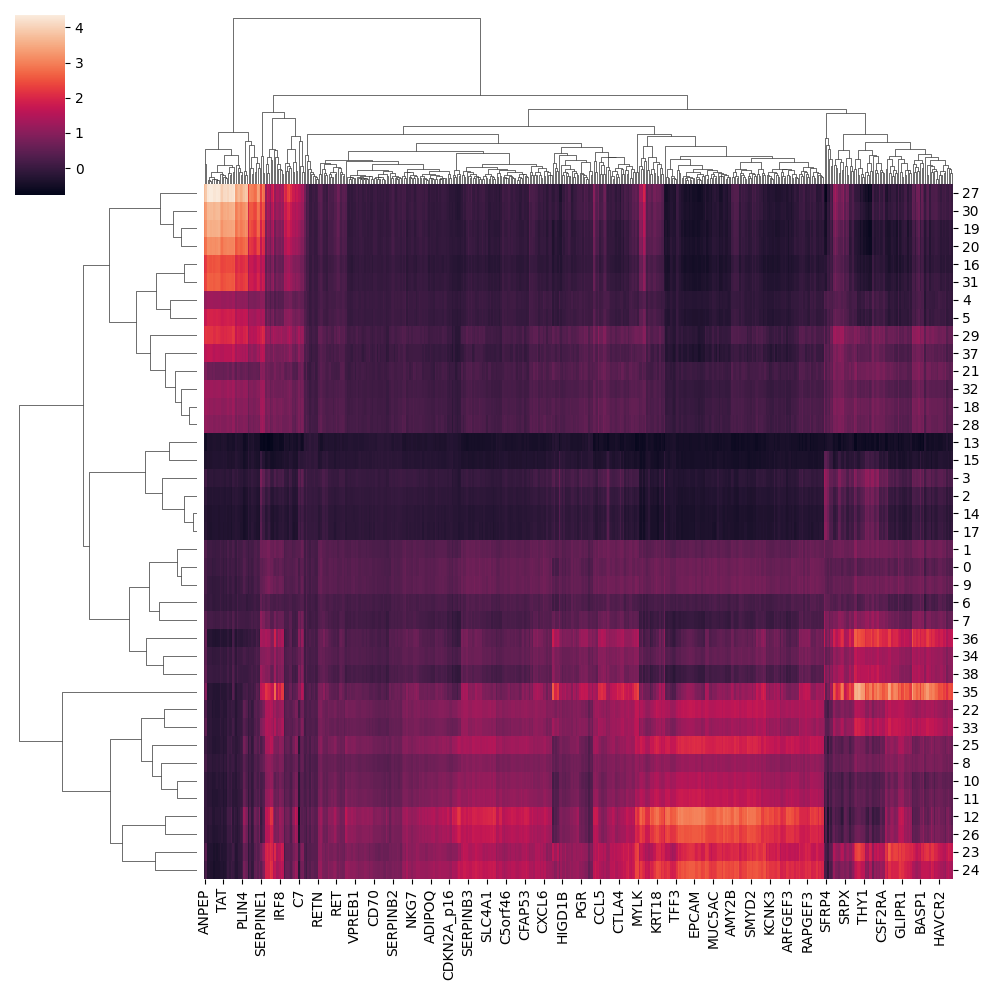

In [45]:
sns.clustermap(dtype_to_df['xenium'])

In [69]:
mushroom.section_positions

array([ 0,  4,  5,  6,  9, 10, 11, 12, 15, 16, 17, 19, 20, 23, 24, 25, 26,
       28, 29, 31, 33, 34, 35, 36, 37, 39, 40, 41])

In [63]:
positions = [p for p, (_, x) in zip(mushroom.section_positions, mushroom.section_ids) if x == 'xenium']
positions

[5, 10, 17, 24, 35]

In [70]:
positions = [0, *positions, 41]
positions

[0, 5, 10, 17, 24, 35, 41]

In [71]:
gene_idxs = [spore.dtype_to_channels['xenium'].index(g) for g in ['EPCAM', 'CXCL6', 'PTPRC']]
gene_idxs

[167, 138, 361]

In [72]:
volume = np.stack(spore.true_pixels)
volume = rearrange(volume, 'n h w c -> c n h w')
volume = volume[gene_idxs]
volume.shape

(3, 5, 100, 76)

In [73]:
interpolated = utils.get_interpolated_volume(volume, positions, method='linear')
interpolated.shape

(3, 42, 100, 76)

In [74]:
tifffile.imwrite('/data/estorrs/sandbox/test.tif', interpolated)

In [47]:
spore = mushroom.dtype_to_spore['xenium']

In [48]:
spore.true_pixels

[array([[[-0.1743346 , -0.24107553, -0.33984378, ..., -0.48958334,
          -0.4887162 , -0.42167267],
         [-0.1743346 , -0.24107553, -0.33984378, ..., -0.48958334,
          -0.4887162 , -0.42167267],
         [-0.1743346 , -0.24107553, -0.33984378, ..., -0.48958334,
          -0.4887162 , -0.42167267],
         ...,
         [-0.1743346 , -0.24107553, -0.33984378, ..., -0.48958334,
          -0.4887162 , -0.42167267],
         [-0.1743346 , -0.24107553, -0.33984378, ..., -0.48958334,
          -0.4887162 , -0.42167267],
         [-0.1743346 , -0.24107553, -0.33984378, ..., -0.48958334,
          -0.4887162 , -0.42167267]],
 
        [[-0.1743346 , -0.24107553, -0.33984378, ..., -0.48958334,
          -0.4887162 , -0.42167267],
         [-0.1743346 , -0.24107553, -0.33984378, ..., -0.48958334,
          -0.4887162 , -0.42167267],
         [-0.1743346 , -0.24107553, -0.33984378, ..., -0.48958334,
          -0.4887162 , -0.42167267],
         ...,
         [-0.1743346 , -0.2410755

In [50]:
spore.true_pixels.shape

AttributeError: 'list' object has no attribute 'shape'

In [51]:
len(spore.true_pixels)

5

In [54]:
len(spore.cluster_probs[0])

5

In [55]:
spore.true_pixels[0].shape

(100, 76, 477)

In [46]:
fp = os.path.join(project_dir, case, 'mushroom_50res', f'outputs.pkl')
data = pickle.load(
    open(fp, 'rb')
)
data.keys()

dict_keys(['section_positions', 'section_ids', 'dtype_to_volume', 'dtype_to_volume_probs', 'dtype_to_clusters', 'dtype_to_cluster_probs', 'dtype_to_cluster_probs_all', 'dtype_to_cluster_intensities', 'dtype_to_cluster_to_agg'])

In [52]:
data['section_ids']

[('S18-9906-U1', 'visium'),
 ('S18-9906-U1', 'he'),
 ('S18-9906-U2', 'xenium'),
 ('S18-9906-U3', 'multiplex'),
 ('S18-9906-U5', 'batch2_he'),
 ('S18-9906-U9', 'xenium'),
 ('S18-9906-U10', 'multiplex'),
 ('S18-9906-U12', 'batch2_he'),
 ('S18-9906-U16', 'visium'),
 ('S18-9906-U16', 'he'),
 ('S18-9906-U17', 'xenium'),
 ('S18-9906-U18', 'multiplex'),
 ('S18-9906-U20', 'batch2_he'),
 ('S18-9906-U24', 'xenium'),
 ('S18-9906-U25', 'multiplex')]

In [53]:
data['dtype_to_clusters'].keys()

dict_keys(['integrated', 'batch2_he', 'he', 'multiplex', 'visium', 'xenium'])

In [55]:
# dtype to clusters is a dictionary mapping data types to nbhds for that data types sections for each nbhd level
# for instance here we get xenium nbhds, it is length 3 because there are 3 nbhd levels 
nbhd_sections = data['dtype_to_clusters']['xenium']
len(nbhd_sections)

3

In [57]:
# here we get the final level of neighborhoods
# there are 4 images as there are 4 xenium sections in case
nbhds = nbhd_sections[-1]
nbhds.shape, np.unique(nbhds)

((4, 172, 172),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35]))

In [58]:
# grabbing second xenium section (U9, in this case)
img = nbhds[1]
img.shape

(172, 172)

... storing 'nbhd_xenium_level0' as categorical
... storing 'nbhd_integrated_level0' as categorical
... storing 'nbhd_multiplex_level0' as categorical
... storing 'nbhd_xenium_level1' as categorical
... storing 'nbhd_integrated_level1' as categorical
... storing 'nbhd_multiplex_level1' as categorical
... storing 'nbhd_xenium_level2' as categorical
... storing 'nbhd_integrated_level2' as categorical
... storing 'nbhd_multiplex_level2' as categorical


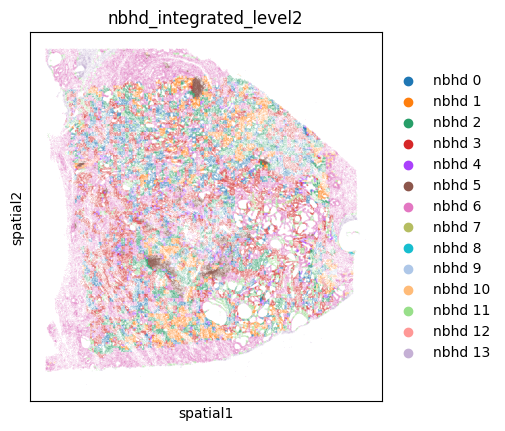

In [32]:
sc.pl.spatial(a, color='nbhd_integrated_level2', alpha_img=0)

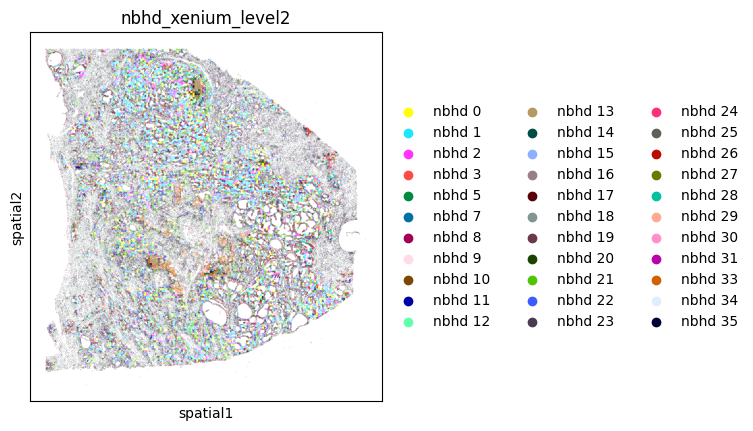

In [33]:
sc.pl.spatial(a, color='nbhd_xenium_level2', alpha_img=0)